In [1]:
%run /home/analysis_user/New_trap_code/Tools/basic_packages.py

plt.rcParams["figure.figsize"] = (16,12)
plt.rcParams["font.size"] = 24
plt.rcParams['xtick.labelsize'] = "small"
plt.rcParams['ytick.labelsize'] = 36

In [2]:
def load_reduced_lists(dirname,file_prefix,max_files,xfb=True,zfb = True,Iz=True,height=True,x_mean=True,y_mean=True,z_mean=True,qpd_sum=True):
    x_fb_list,z_fb_list, height_list,Iz_list,x_mean_list,y_mean_list,z_mean_list,qpd_sum_list= [ [] for x in range(8)]
    files = []
   
    [files.append(file_) for file_ in os.listdir(dirname) if file_.startswith(file_prefix) if file_.endswith('.h5')]
    files.sort(key=lambda f: int(''.join(filter(str.isdigit, f))))        
    step_size = 100
    for j in tqdm(np.arange(0,max_files,step_size)):
        BDFs = [BDF.BeadDataFile(dirname+filename) for filename in files[j:j+step_size]]
        for k in range(len(BDFs)):
            if(xfb==True):
                x_fb_list.append(BDFs[k].feedback[0].mean())
            if(zfb==True):
                z_fb_list.append(BDFs[k].feedback[2].mean())
            if(Iz==True):
                Iz_list.append(au_to_power(BDFs[k].Iz.mean()))
            if(height==True):
                height_list.append(BDFs[k].bead_height)
            if(x_mean==True):
                x_mean_list.append(BDFs[k].x2.mean())
            if(y_mean==True):
                y_mean_list.append(BDFs[k].y2.mean())
            if(z_mean==True):
                z_mean_list.append(BDFs[k].z2.mean())
            if(qpd_sum==True):
                qpd_sum_list.append(BDFs[k].quad_sum.mean()) 
    df=pd.DataFrame()


    return x_fb_list,z_fb_list,Iz_list,height_list,x_mean_list,y_mean_list,z_mean_list,qpd_sum_list                                 
                                 

    

In [3]:
dirname="/data/new_trap/20200930/Bead1/Discharge/FineDischarge/HeightResponseCheck/"
file_prefix="Discharge"

in_phase = []
# load the files
for i in np.arange(0,3765,15):
    files_discharge = load_dir_sorted(dirname=dirname, 
                             start_file=i, max_file=15)

    # set the drive and settings for the correlation
    fdrive=71
    nsamp = 50000
    fsamp = 5000
    sigamp = 1
    tarr = np.arange(0, nsamp/fsamp, 1.0/fsamp)
    sig = sigamp * np.sin(2.0 * np.pi * fdrive * tarr)

    # get the in-phase response z
    corrs = [correlation(drive=sig, response=files.z2, fsamp=fsamp, fdrive=fdrive, filt=True, band_width=1) for files in tqdm(files_discharge)]
    indices = [np.argmax(cc) for cc in corrs]
    for cc in corrs:
        in_phase.append(cc[0])



In [4]:
df = pd.read_pickle("height_response_with_wave_and_env_data.pkl")

In [32]:
temp = df.Height[df.Height!=0]

In [42]:
df.Height

0       -0.35
1       -0.38
2       -0.28
3       -0.26
4       -0.23
        ...  
3760    10.06
3761    10.17
3762    10.21
3763    10.17
3764    10.21
Name: Height, Length: 3765, dtype: float64

In [39]:
df.Time_Epoch[0]-df.Time_Epoch[1]

-11.154464483261108

Text(0.5, 0, 'time')

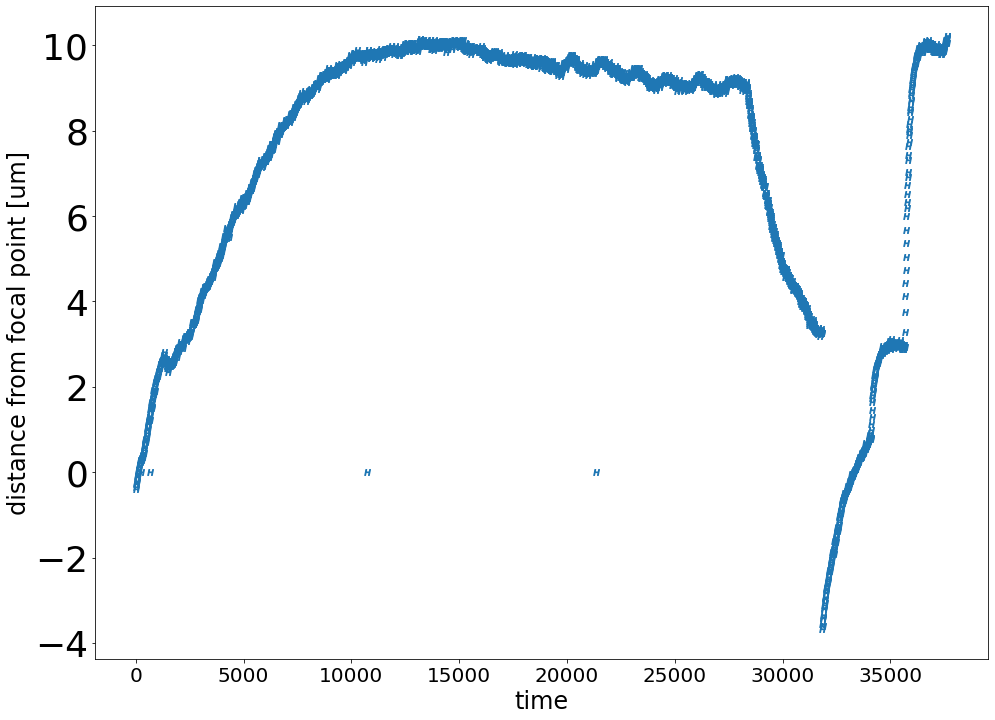

In [43]:
x=np.arange(0,len(df.Height)*10,10)
plt.plot(x,df.Height,linestyle="",marker="$H$")
plt.ylabel("distance from focal point [um]")
plt.xlabel("time")

#plt.plot(df.Response/np.mean(df.Response))


(1064.525, 1064.53)

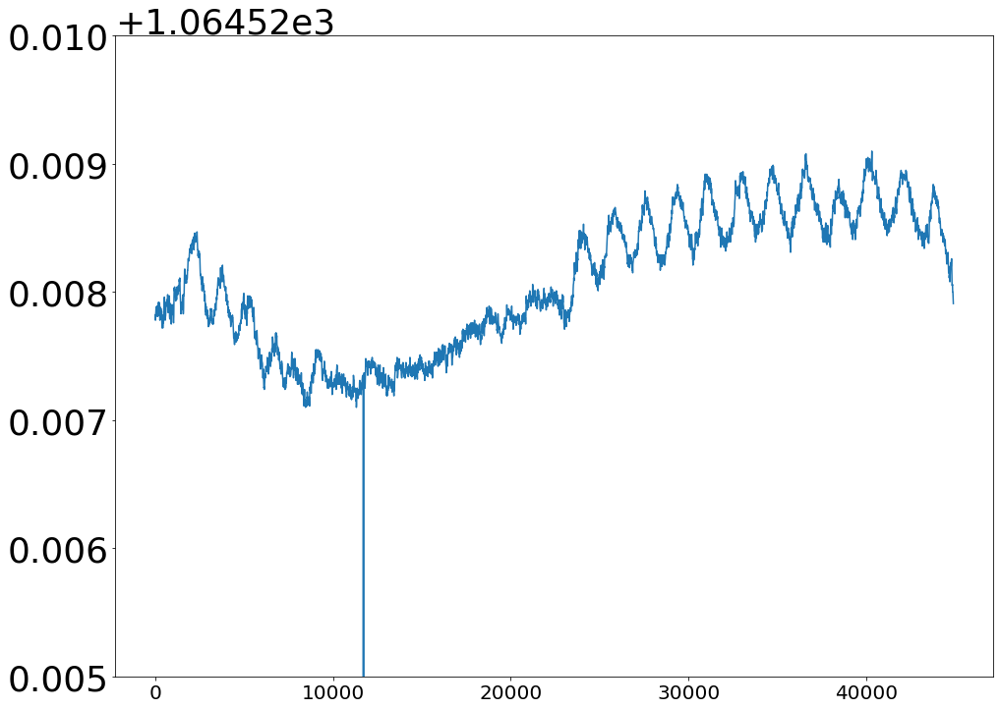

In [7]:
plt.plot(df.Time_Epoch-df.Time_Epoch[0],df.Wave_Length)
plt.ylim(1064.525,1064.53)

(-15.0, 15.0)

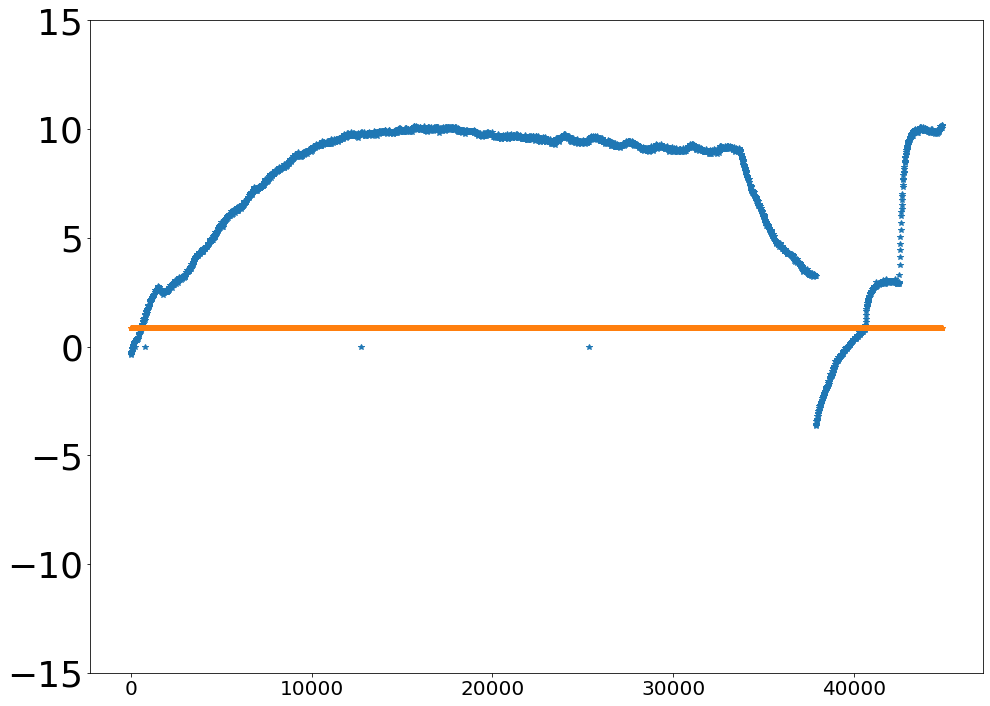

In [35]:
plt.plot(df.Time_Epoch-df.Time_Epoch[0],df.Height,linestyle="",marker="*")
plt.plot(df.Time_Epoch-df.Time_Epoch[0],(df.Wave_Length-np.mean(df.Wave_Length)),linestyle="",marker="*")
plt.ylim(-15,15)
#plt.xlim(37800,38000)
    #plt.plot(df.Time_Epoch,df.Height)

Time_Epoch
Height
Response
Wave_Length
Time_Stamp_WN
xfb
zfb
Iz
x_mean
y_mean
z_mean
qpd_sum
AirTemperature
SurfaceTemperature
Pressure


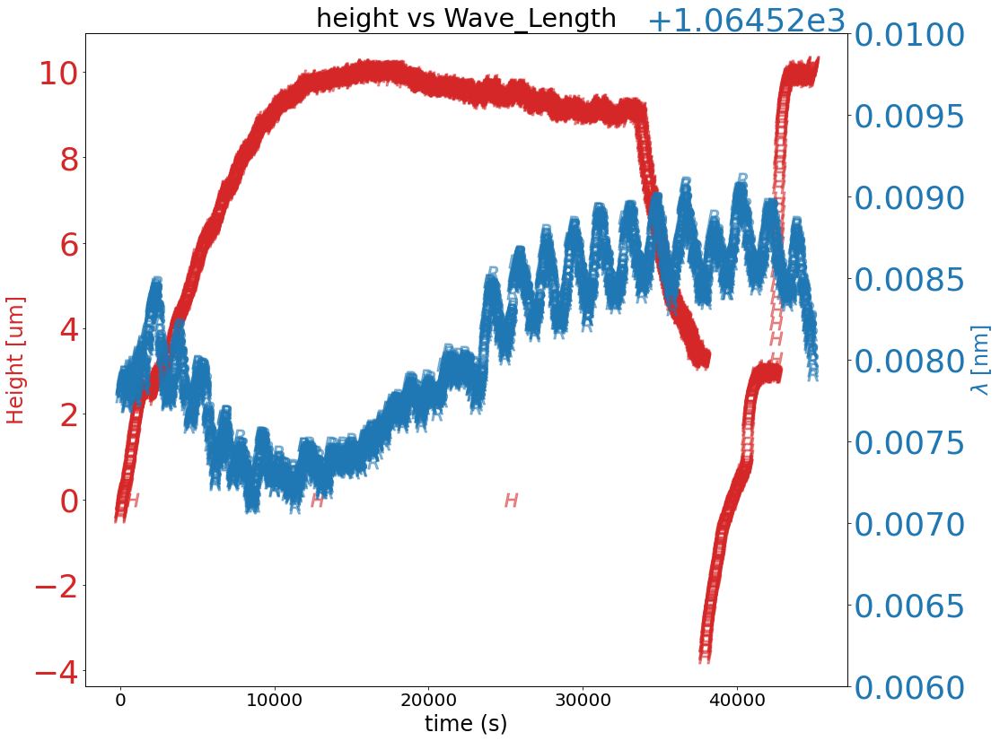

In [70]:
col = "Wave_Length"
x = df.Time_Epoch-df.Time_Epoch[0]
avg = 1
data1=df.Height.ewm(span=avg,adjust=True).mean()
data2=df["%s" %col].ewm(span=avg,adjust=True).mean()
fig, ax1 = plt.subplots()
color = 'tab:red'
ax1.set_title("height vs %s" %(col))
ax1.set_xlabel('time (s)')
ax1.set_ylabel("Height [um]", color=color)
ax1.plot(x,data1, color=color, alpha=0.5,linestyle="",marker="$H$",markersize=15)
#ax1.set_xlim(35000,)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('$\lambda$ [nm]', color=color)  # we already handled the x-label with ax1
ax2.plot(x,data2, color=color, alpha=0.5,linestyle="",marker="$R$",markersize=15)
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(1064.526,1064.530)    

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

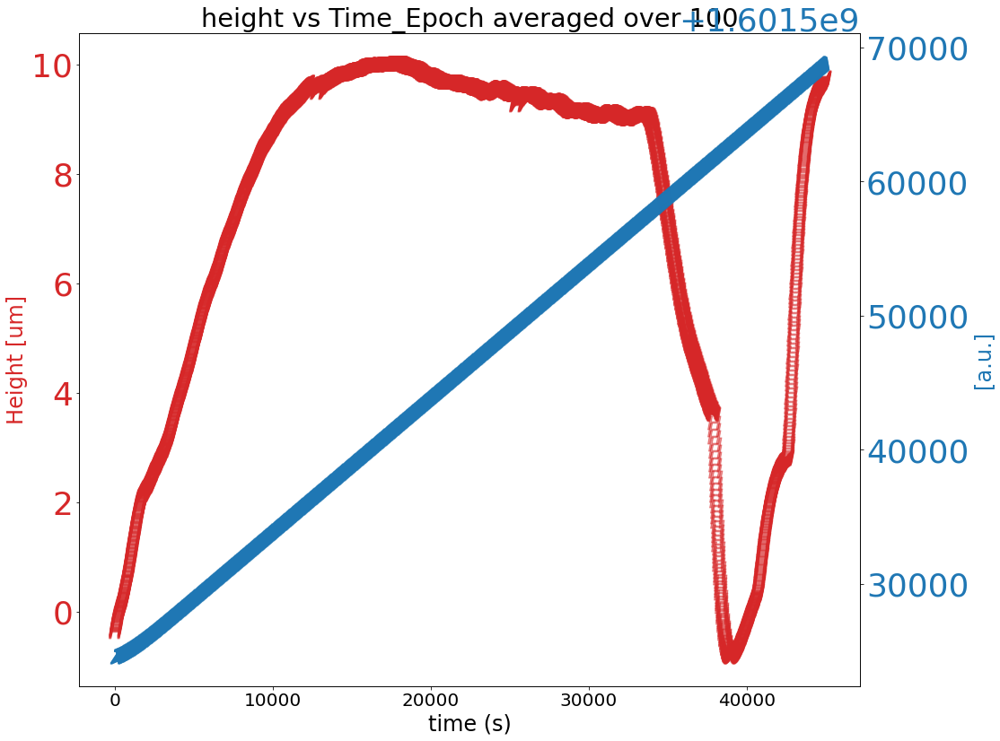

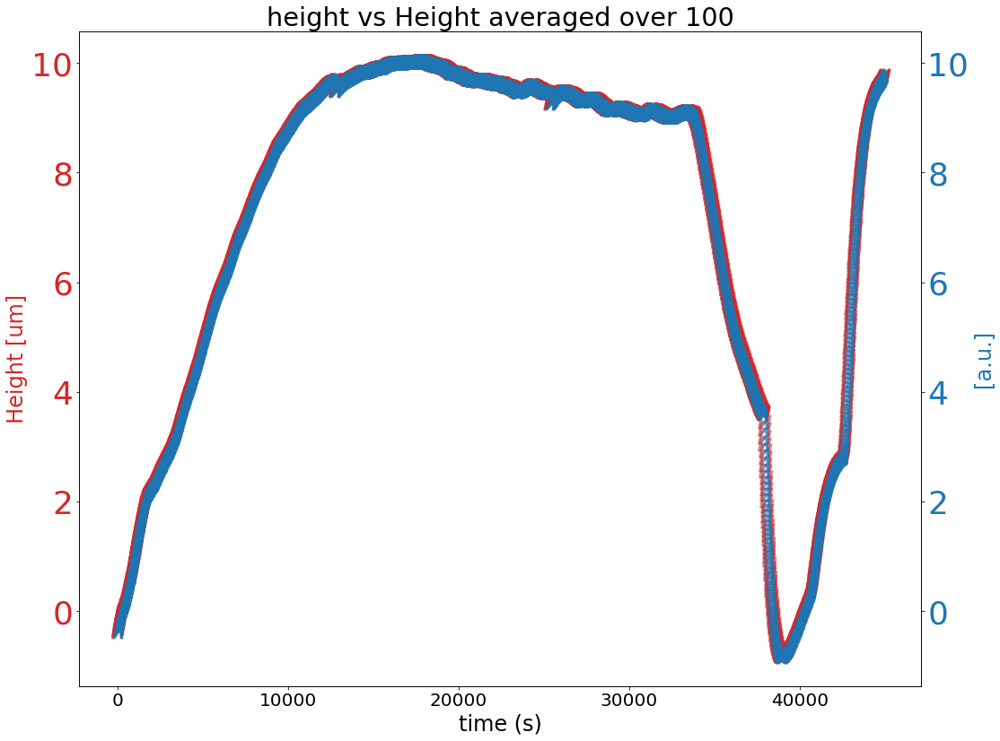

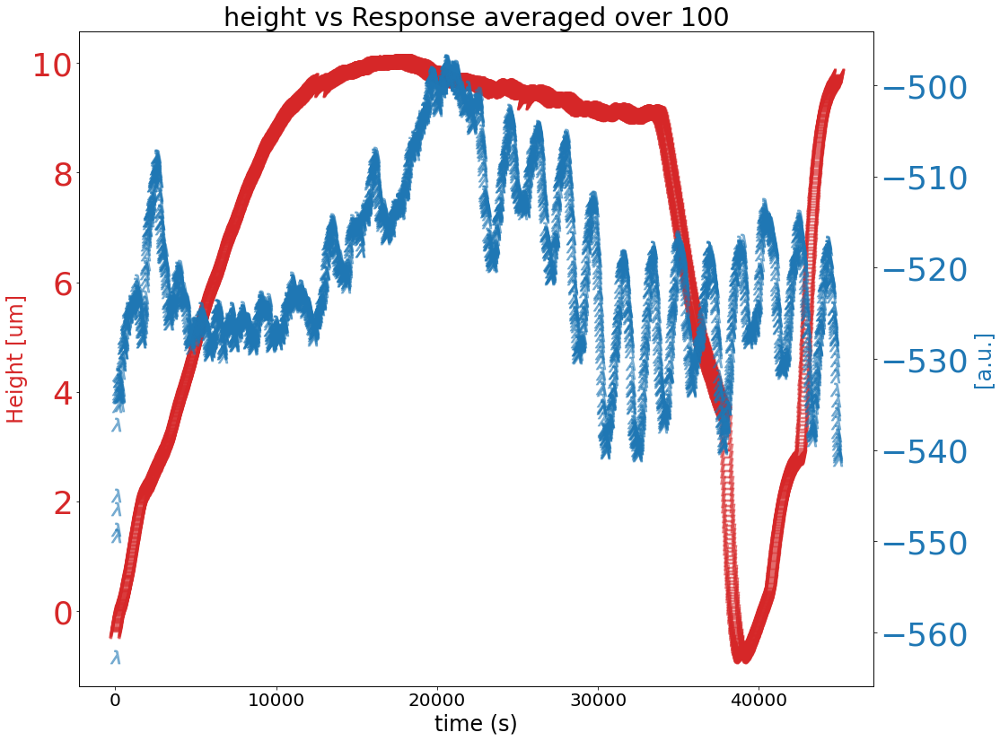

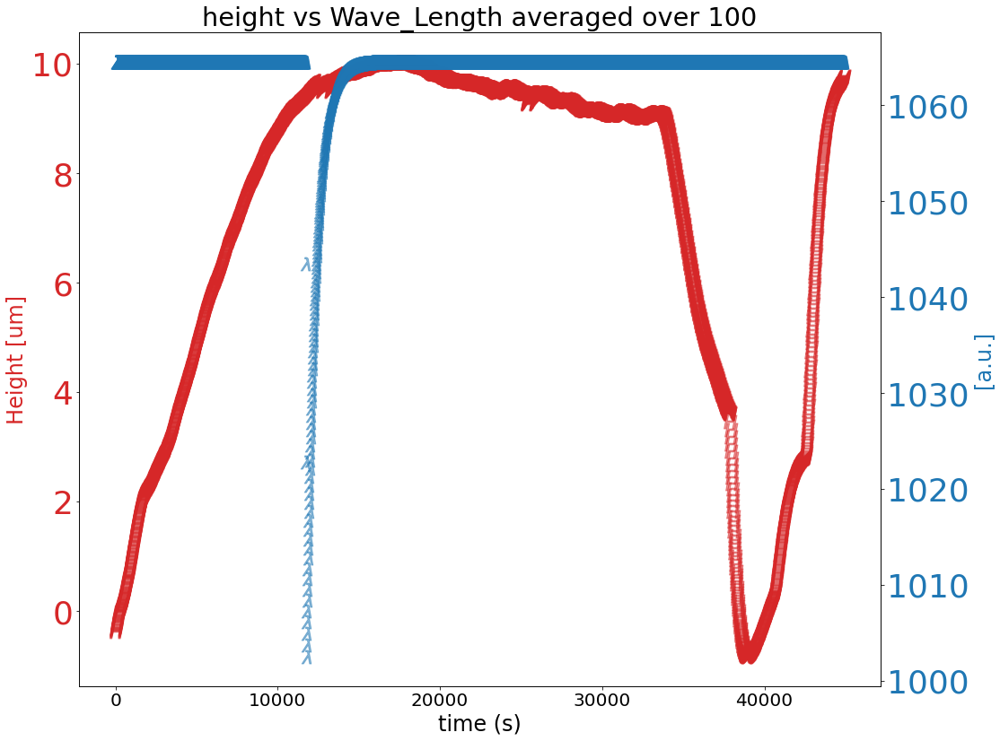

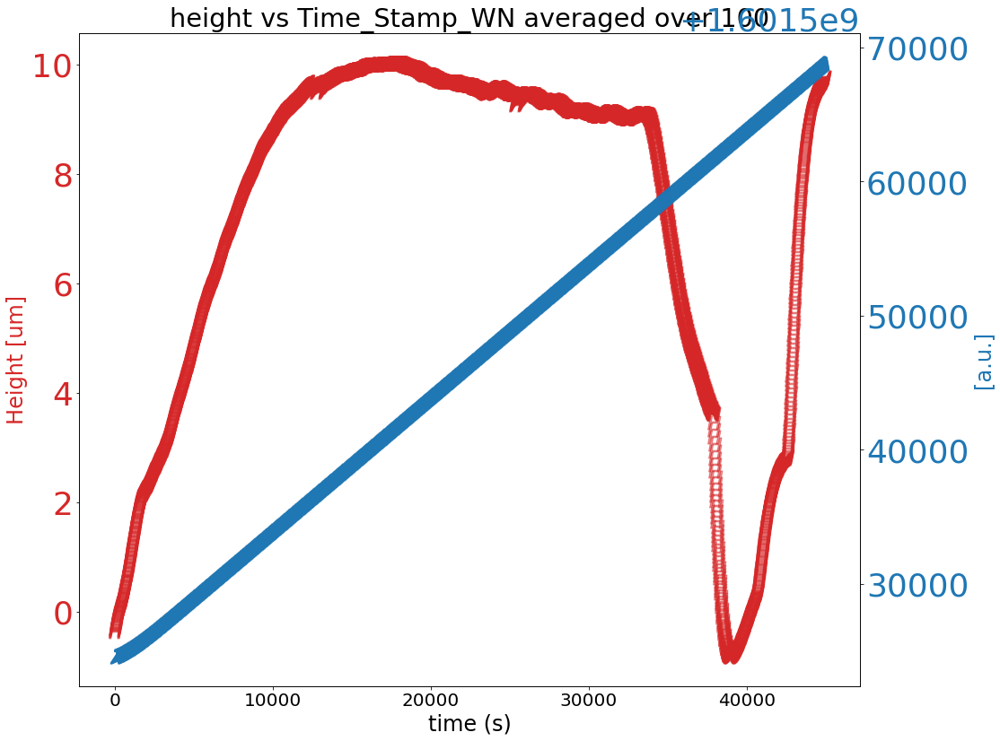

...

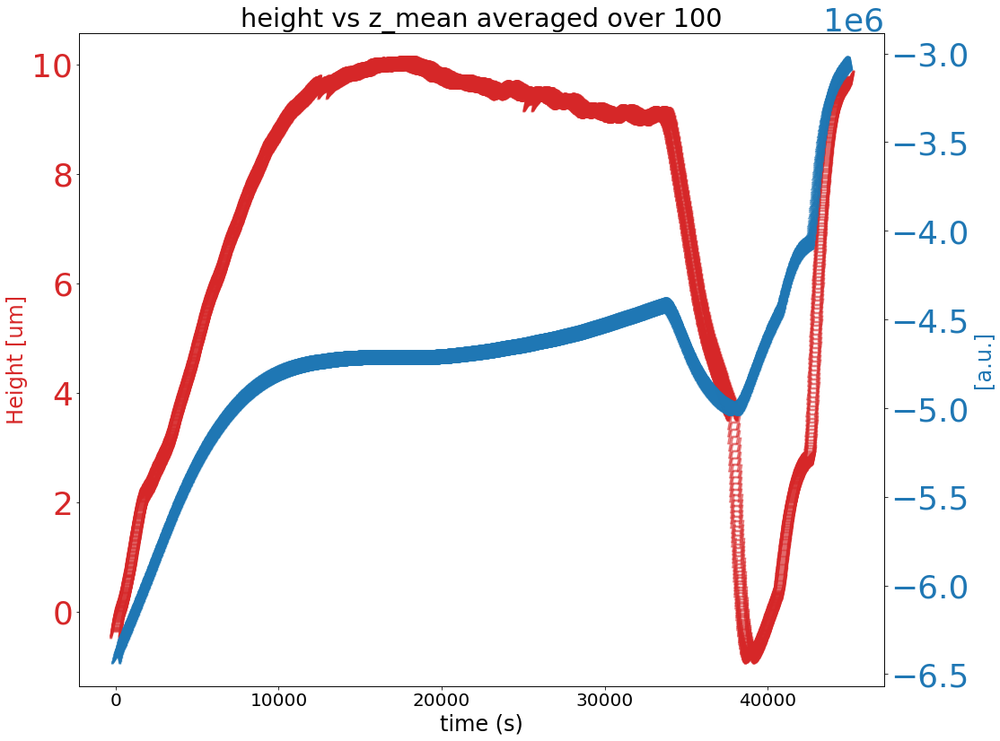

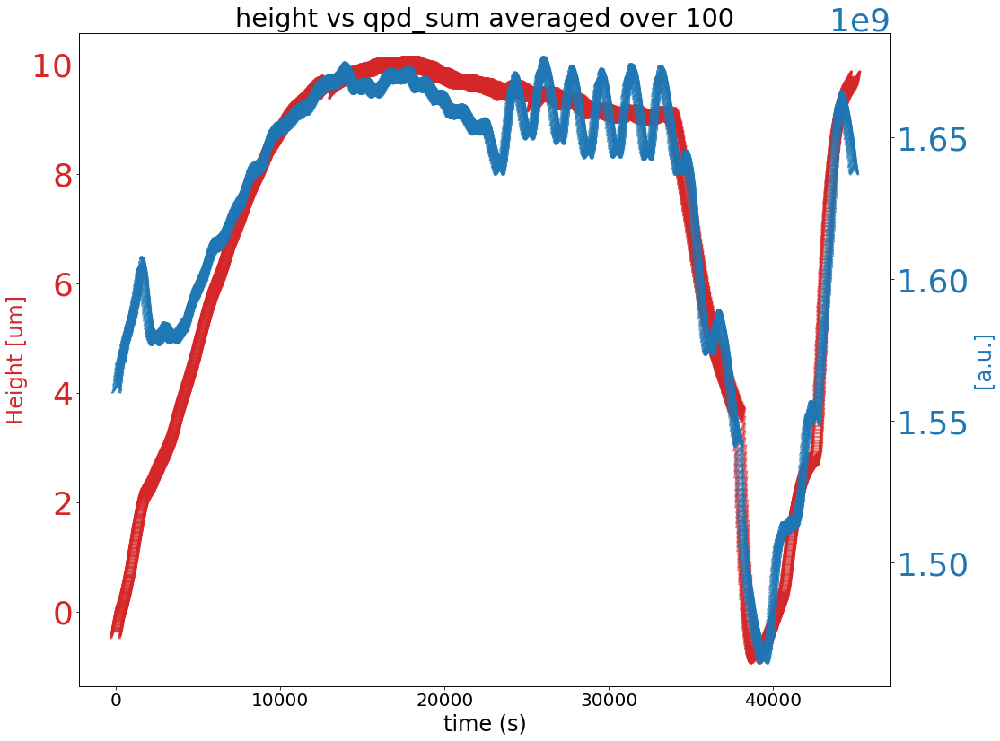

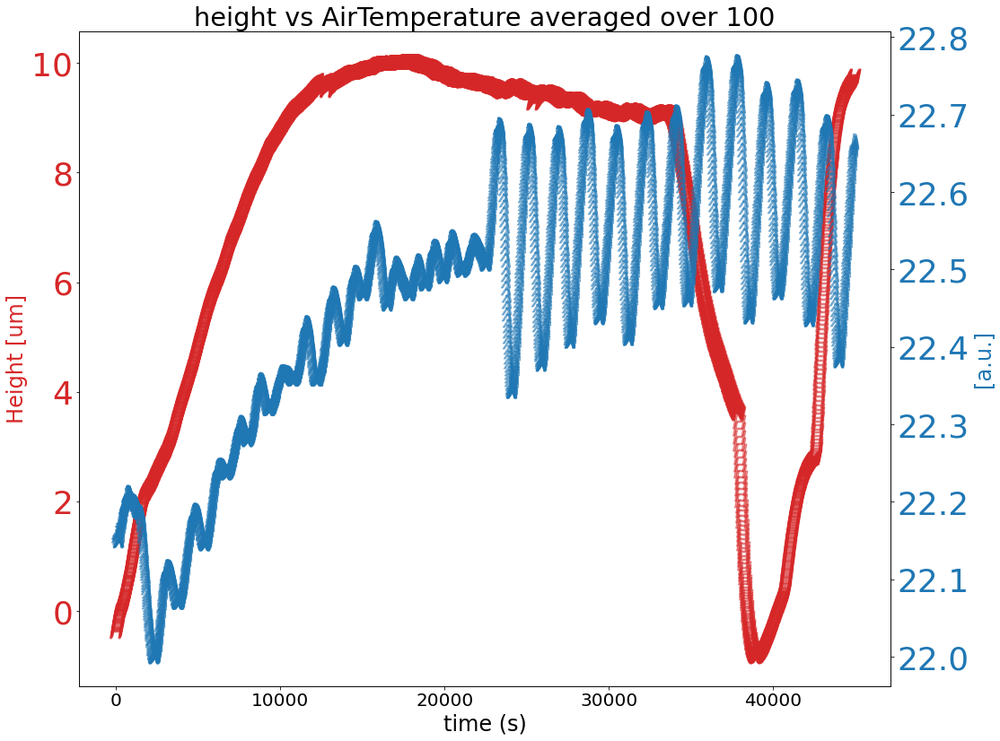

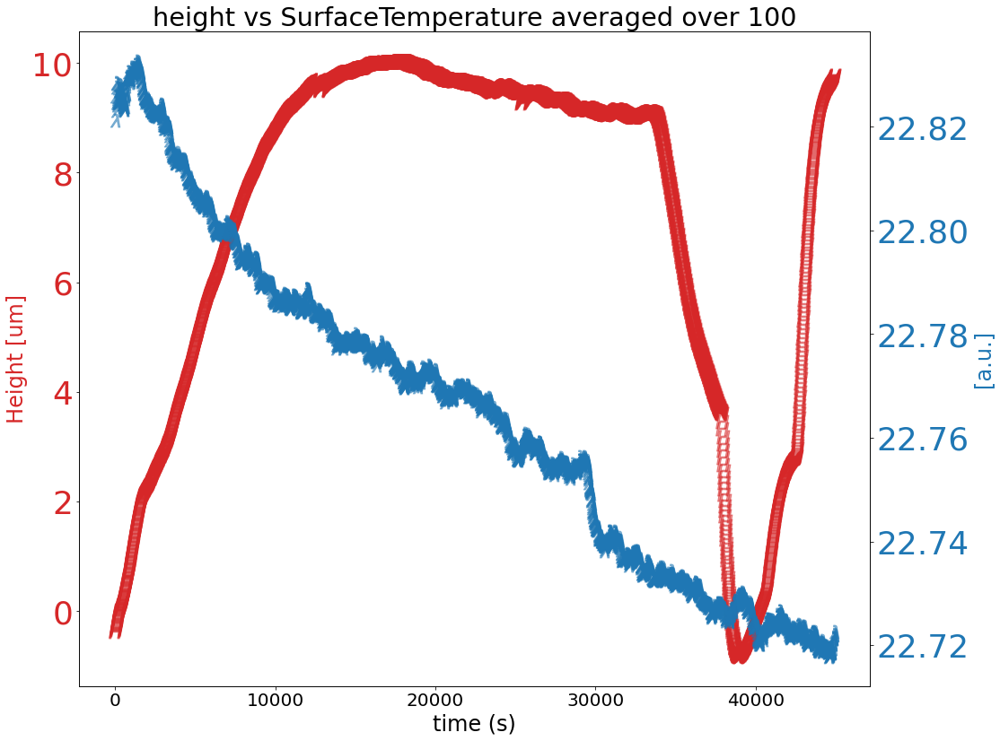

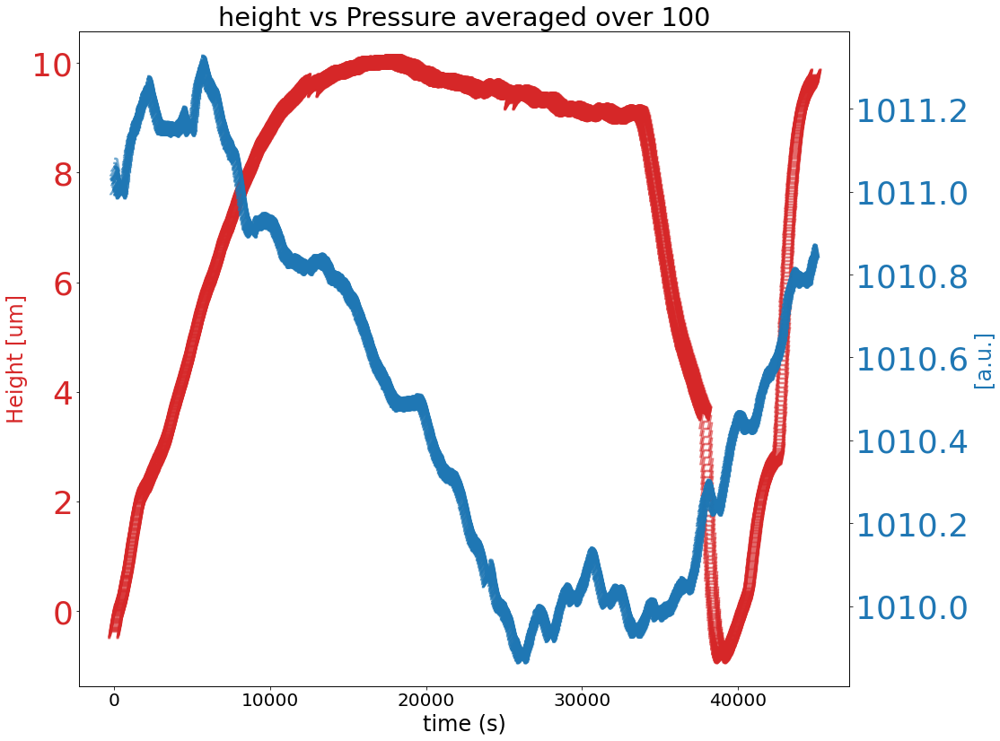

In [55]:
for col in df.columns:
    x = df.Time_Epoch-df.Time_Epoch[0]
    avg = 100
    data1=df.Height.ewm(span=avg,adjust=True).mean()
    data2=df["%s" %col].ewm(span=avg,adjust=True).mean()
    fig, ax1 = plt.subplots()
    color = 'tab:red'
    ax1.set_title("height vs %s averaged over %d" %(col,avg))
    ax1.set_xlabel('time (s)')
    ax1.set_ylabel("Height [um]", color=color)
    ax1.plot(x,data1, color=color, alpha=0.5,linestyle="",marker="$H$",markersize=15)
    #ax1.set_xlim(35000,)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:blue'
    ax2.set_ylabel('[a.u.]', color=color)  # we already handled the x-label with ax1
    ax2.plot(x,data2, color=color, alpha=0.5,linestyle="",marker="$\lambda$",markersize=15)
    ax2.tick_params(axis='y', labelcolor=color)
    #ax2.set_ylim(np.mean(data2)-np.mean(data2)/100,np.mean(data2)+np.mean(data2)+100)    

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

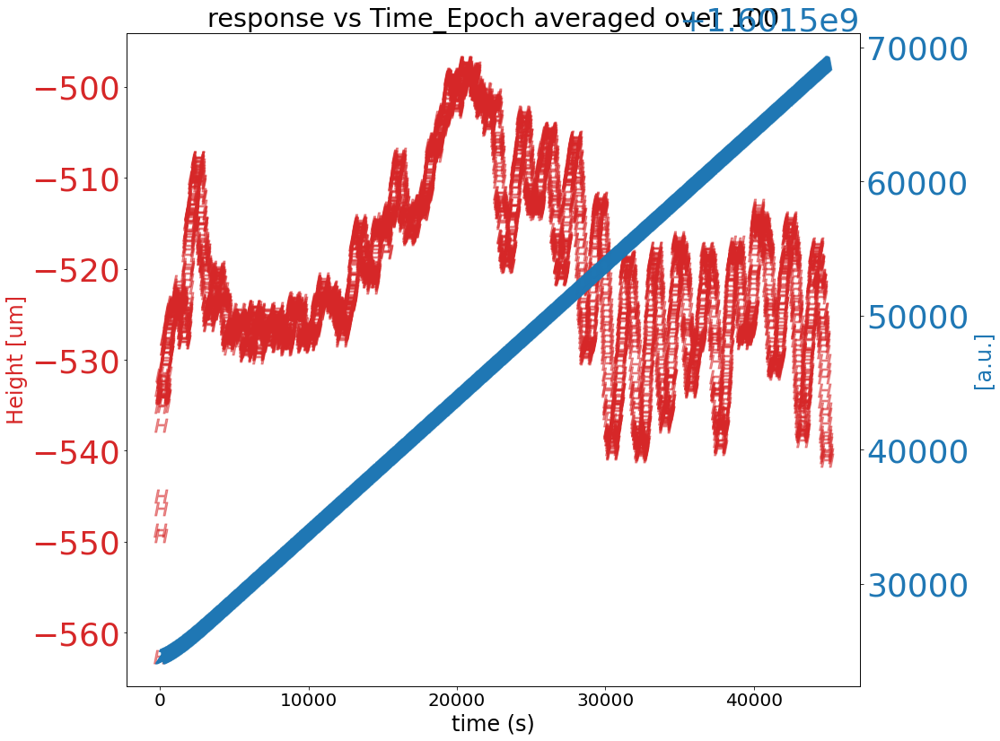

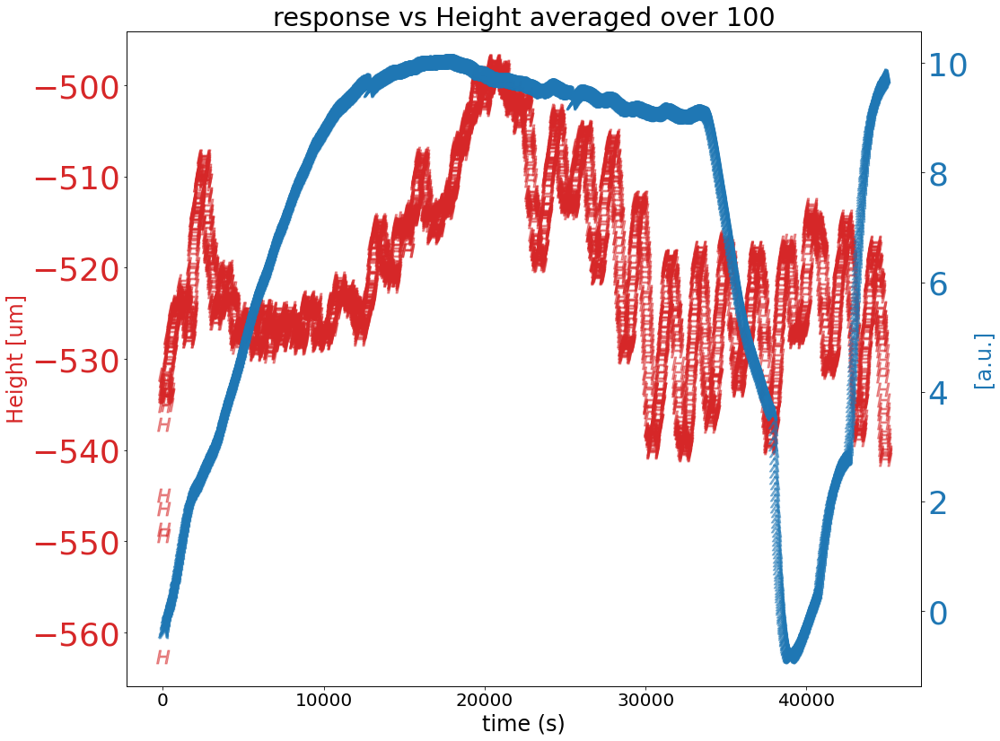

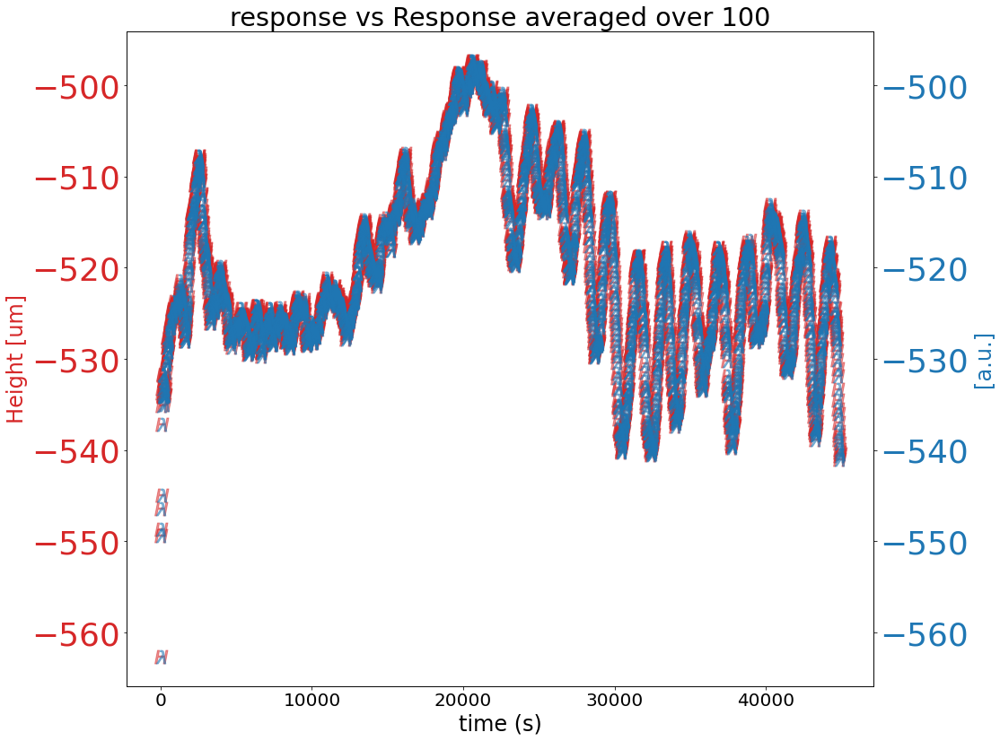

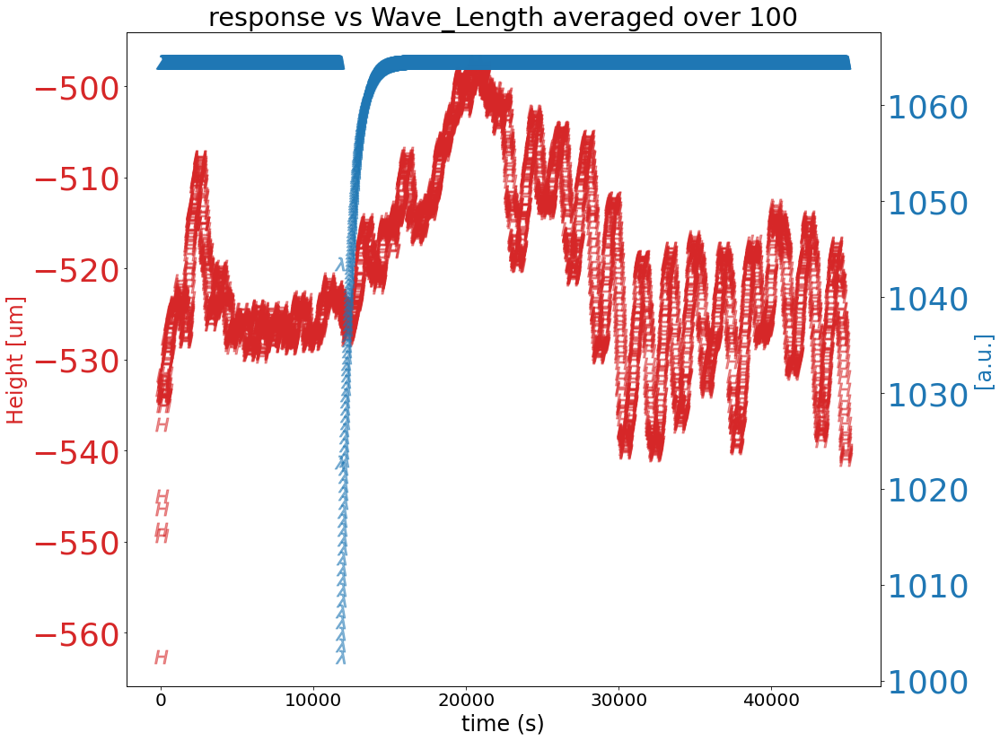

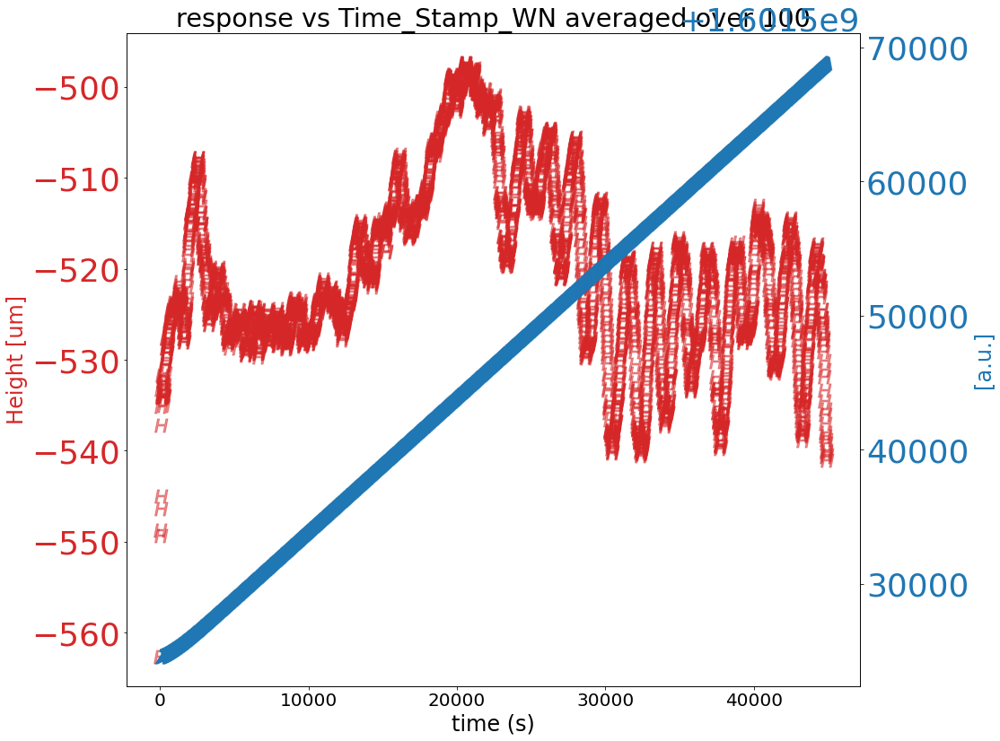

...

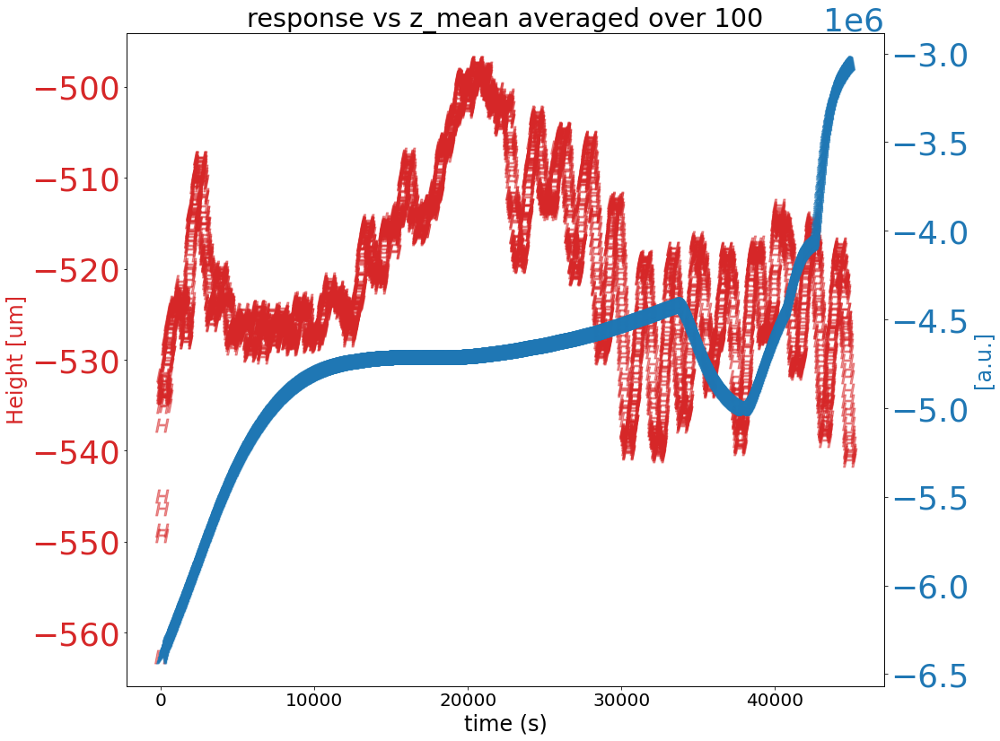

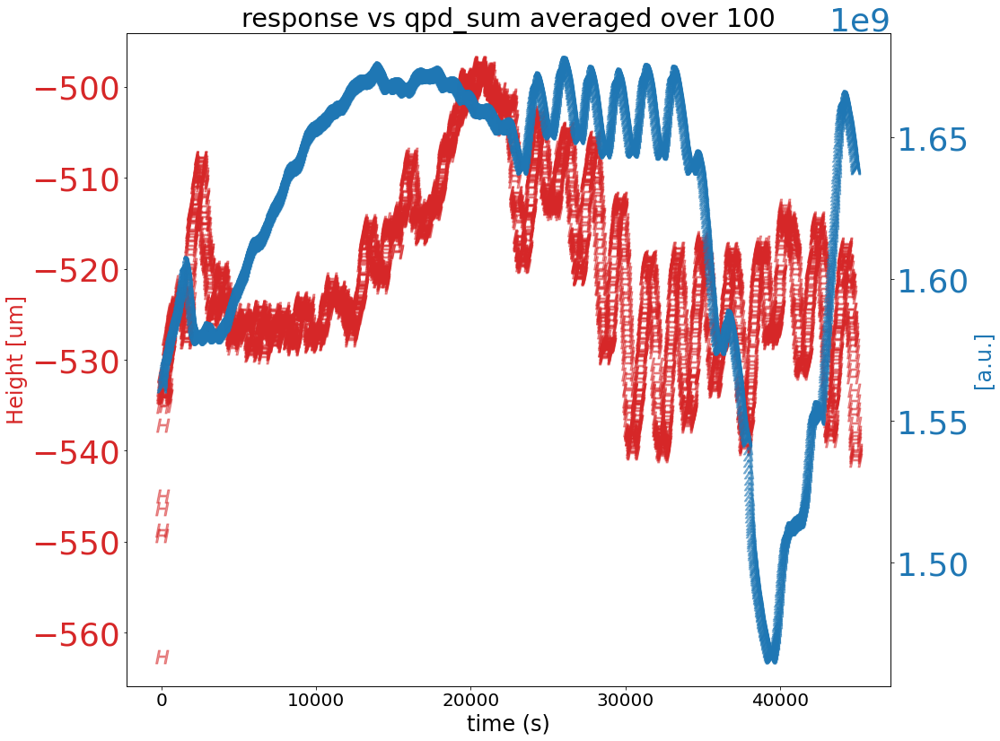

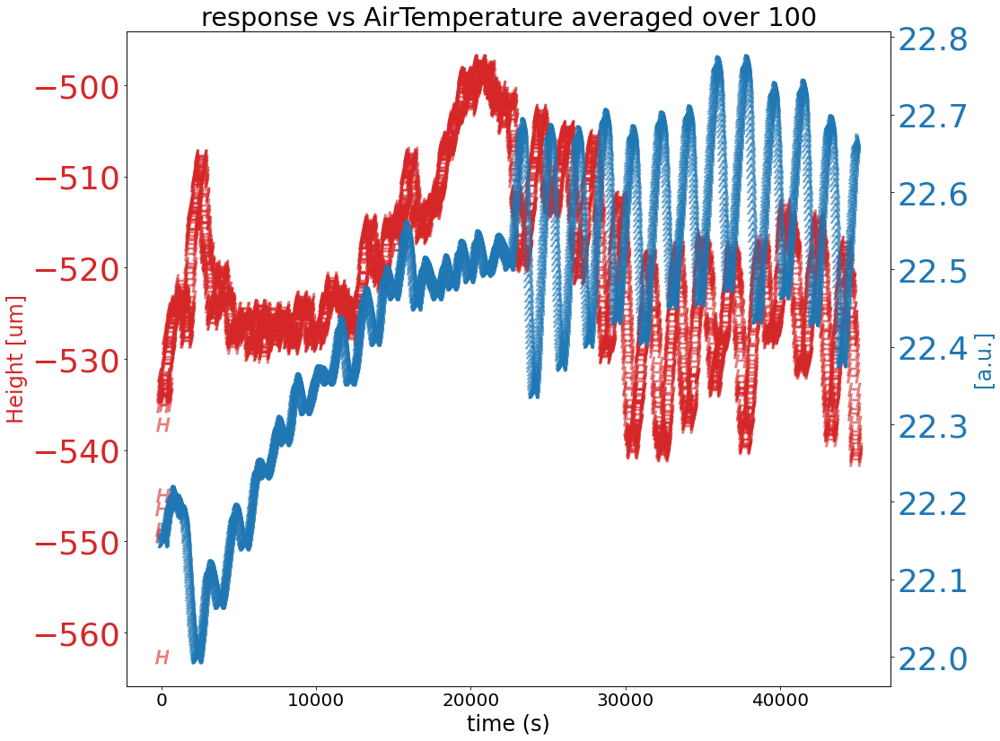

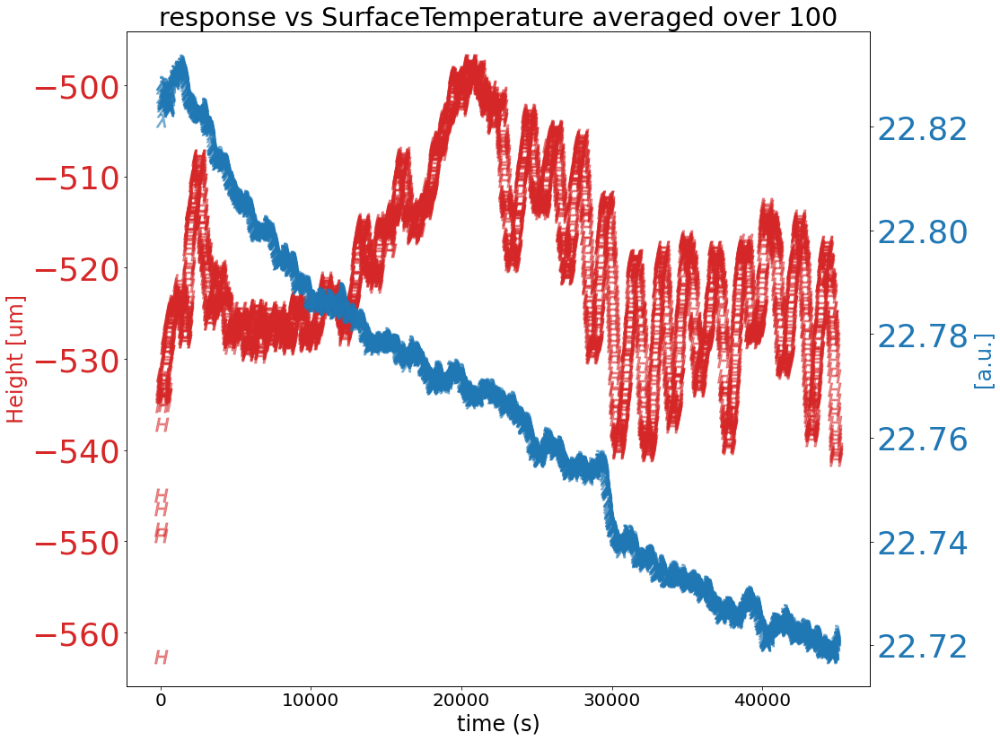

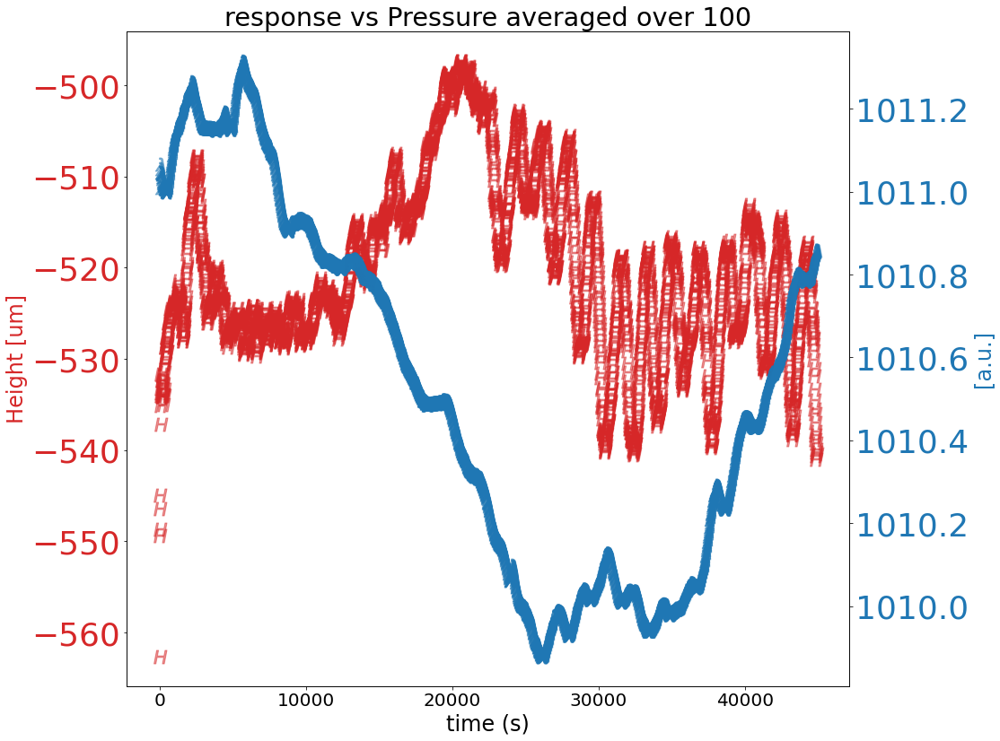

In [74]:
for col in df.columns:
    x = df.Time_Epoch-df.Time_Epoch[0]
    avg = 100
    data1=df.Response.ewm(span=avg,adjust=True).mean()
    data2=df["%s" %col].ewm(span=avg,adjust=True).mean()
    fig, ax1 = plt.subplots()
    color = 'tab:red'
    ax1.set_title("response vs %s averaged over %d" %(col,avg))
    ax1.set_xlabel('time (s)')
    ax1.set_ylabel("Height [um]", color=color)
    ax1.plot(x,data1, color=color, alpha=0.5,linestyle="",marker="$H$",markersize=15)
    #ax1.set_xlim(35000,)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:blue'
    ax2.set_ylabel('[a.u.]', color=color)  # we already handled the x-label with ax1
    ax2.plot(x,data2, color=color, alpha=0.5,linestyle="",marker="$\lambda$",markersize=15)
    ax2.tick_params(axis='y', labelcolor=color)
    #ax2.set_ylim(np.mean(data2)-np.mean(data2)/100,np.mean(data2)+np.mean(data2)+100)    

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

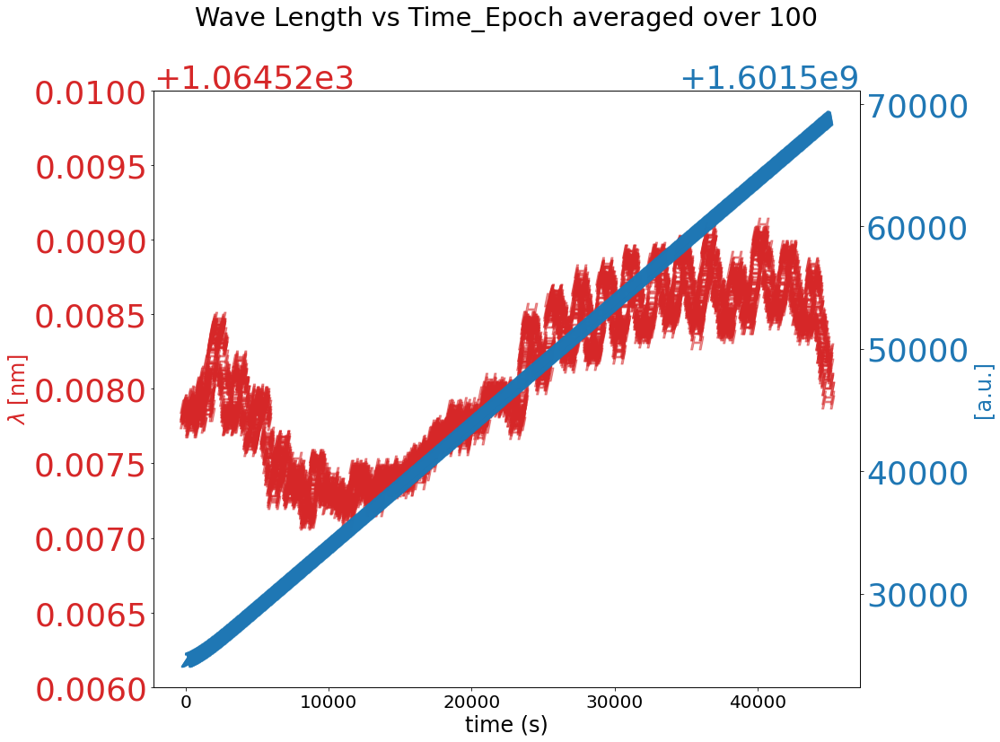

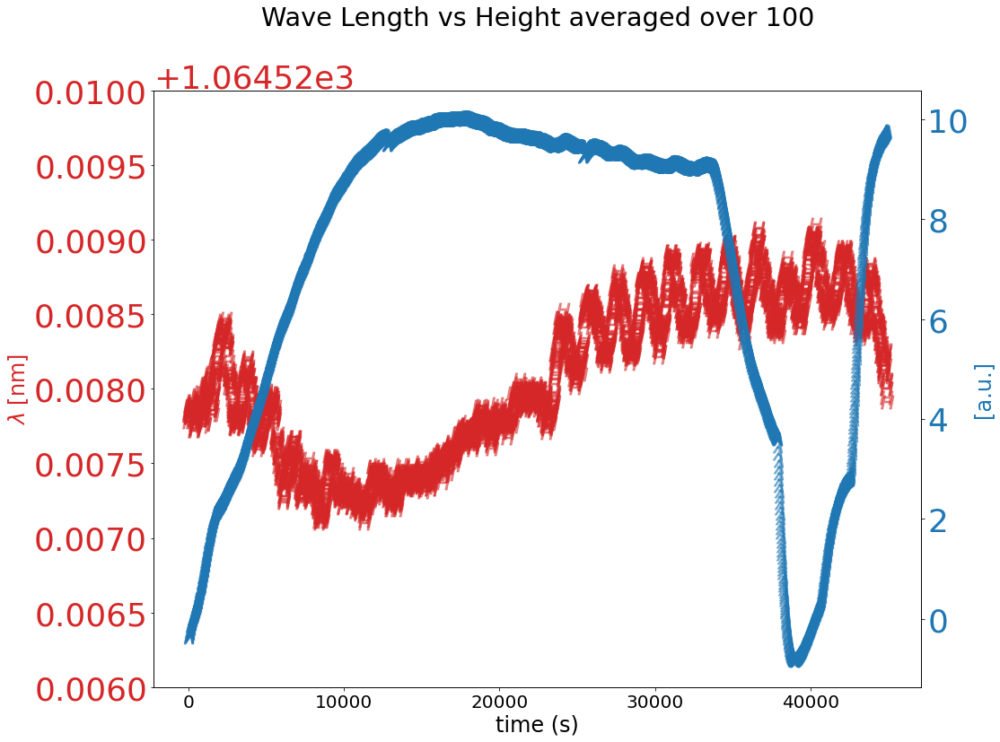

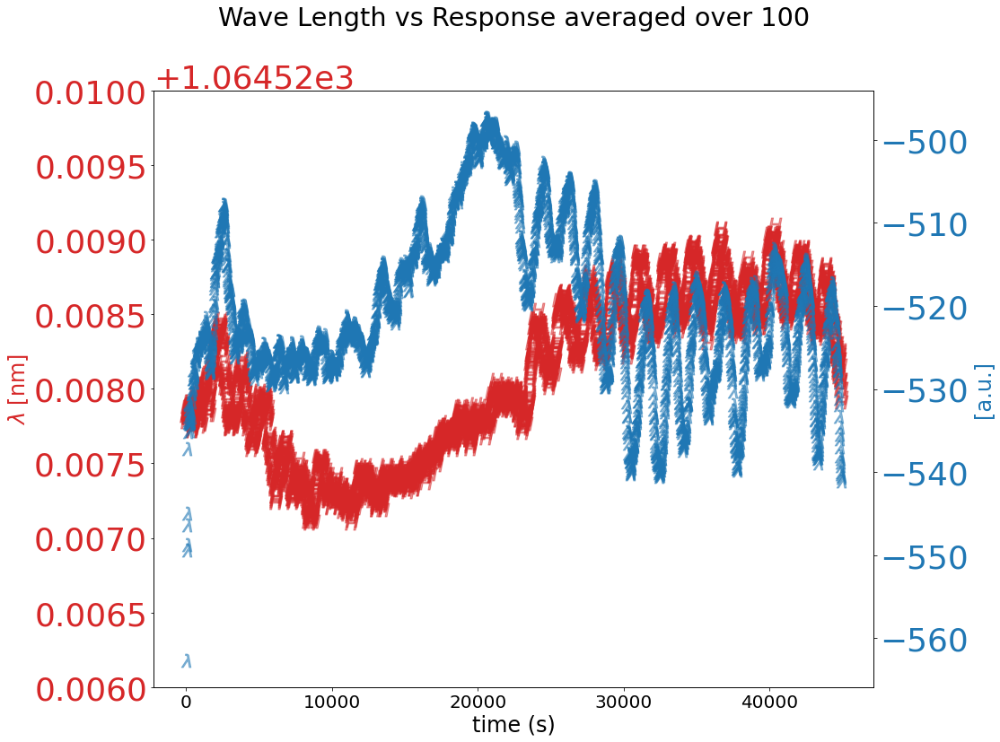

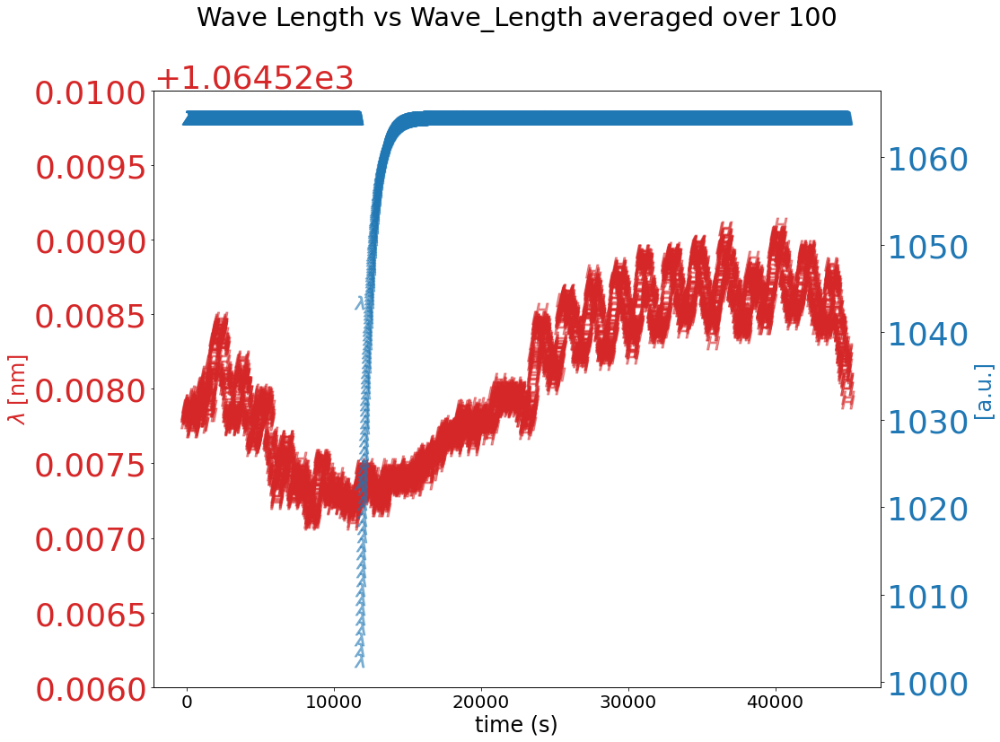

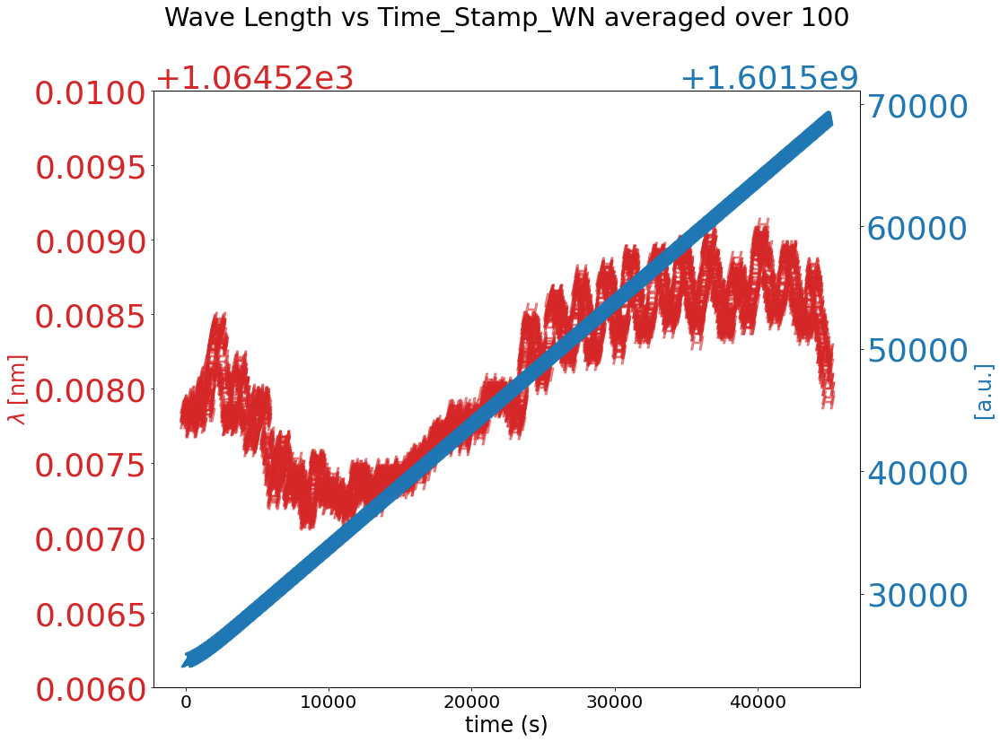

...

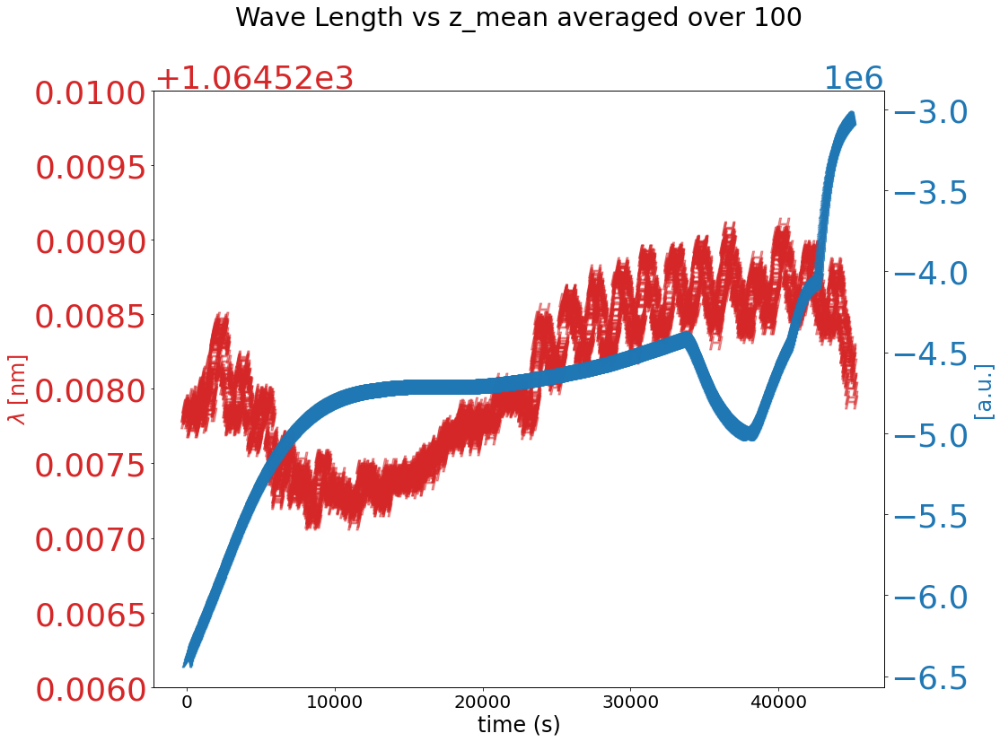

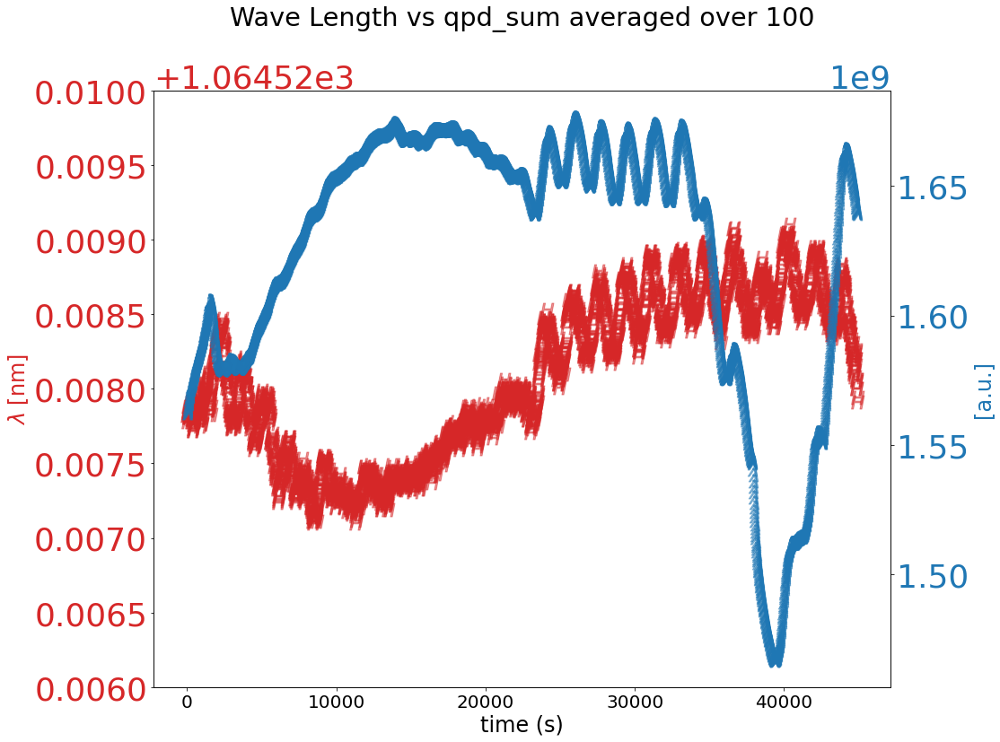

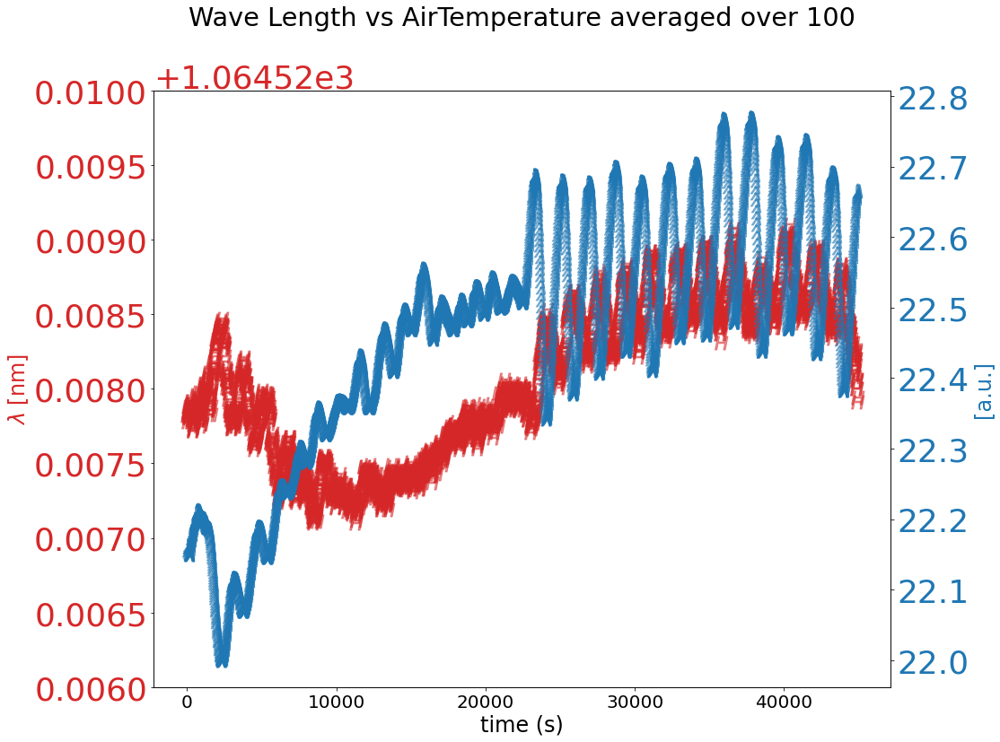

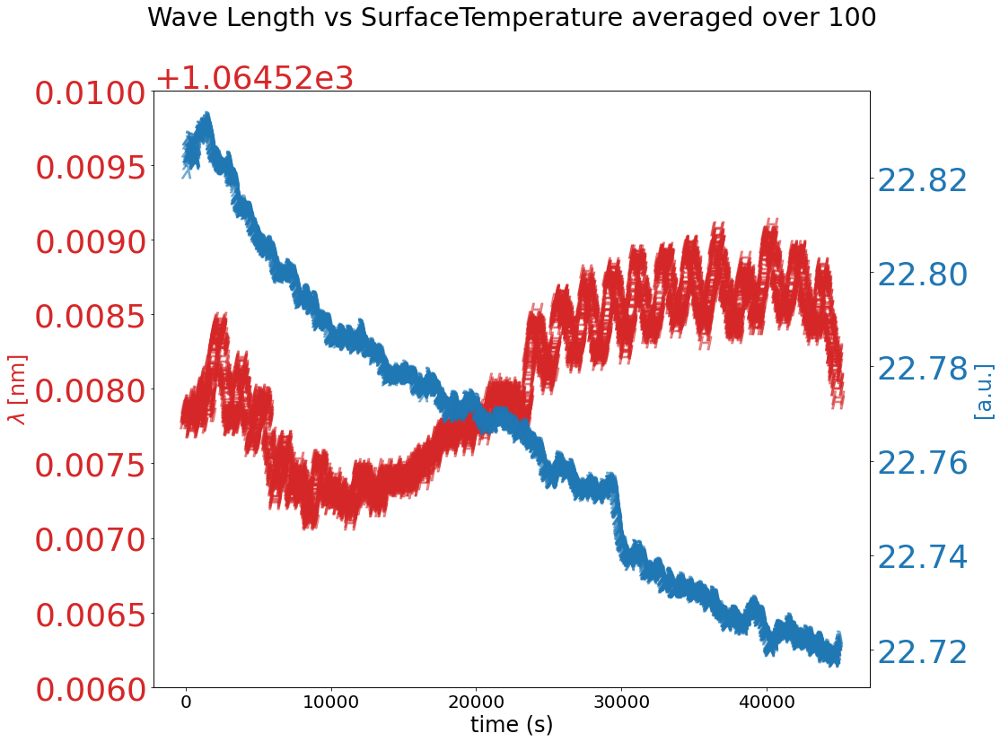

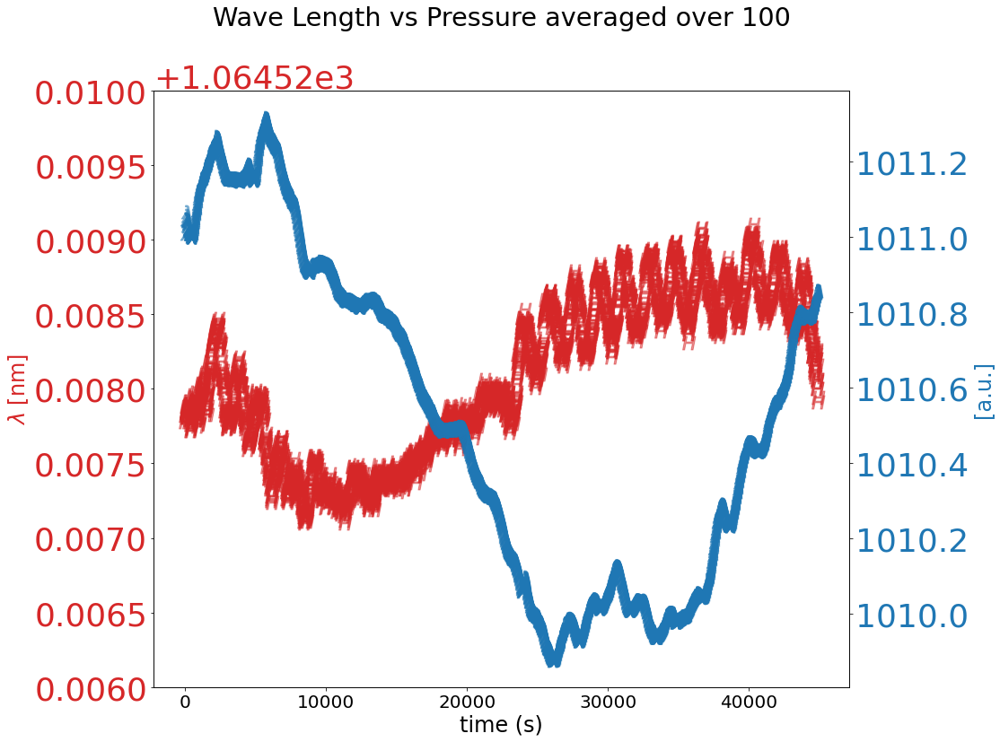

In [81]:
for col in df.columns:
    x = df.Time_Epoch-df.Time_Epoch[0]
    avg = 100
    data1=df.Wave_Length.ewm(span=1,adjust=True).mean()
    data2=df["%s" %col].ewm(span=avg,adjust=True).mean()
    fig, ax1 = plt.subplots()
    color = 'tab:red'
    ax1.set_title("Wave Length vs %s averaged over %d" %(col,avg),y=1.1)
    ax1.set_xlabel('time (s)')
    ax1.set_ylabel("$\lambda$ [nm]", color=color)
    ax1.plot(x,data1, color=color, alpha=0.5,linestyle="",marker="$H$",markersize=15)
    #ax1.set_xlim(35000,)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_ylim(1064.526,1064.530)    

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:blue'
    ax2.set_ylabel('[a.u.]', color=color)  # we already handled the x-label with ax1
    ax2.plot(x,data2, color=color, alpha=0.5,linestyle="",marker="$\lambda$",markersize=15)
    ax2.tick_params(axis='y', labelcolor=color)
    #ax2.set_ylim(np.mean(data2)-np.mean(data2)/100,np.mean(data2)+np.mean(data2)+100)    

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

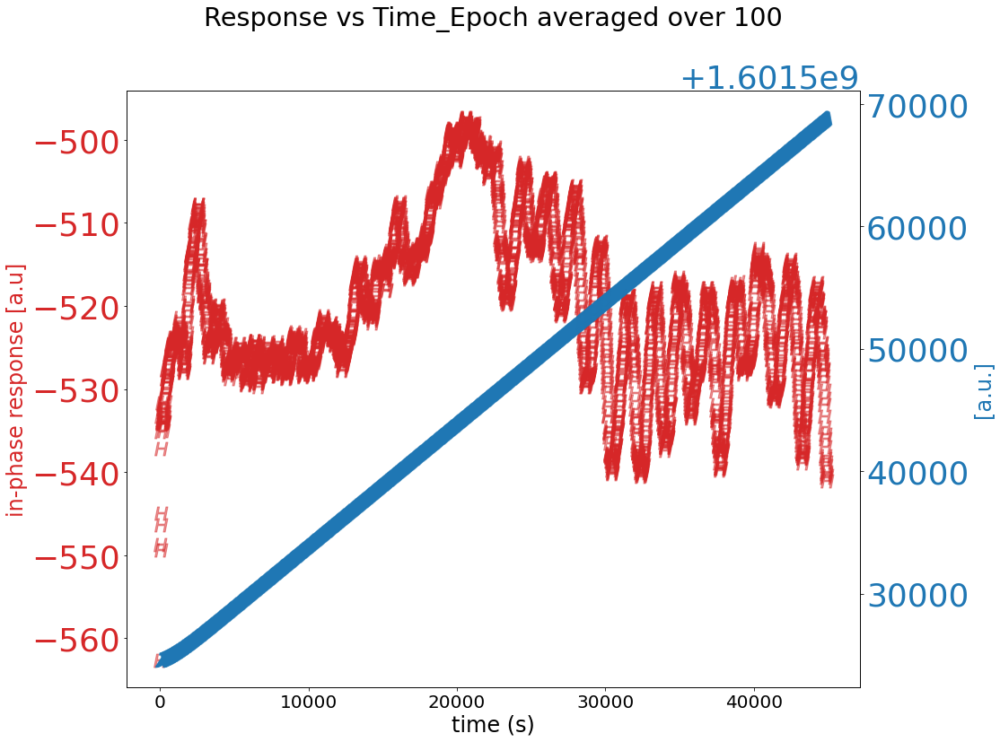

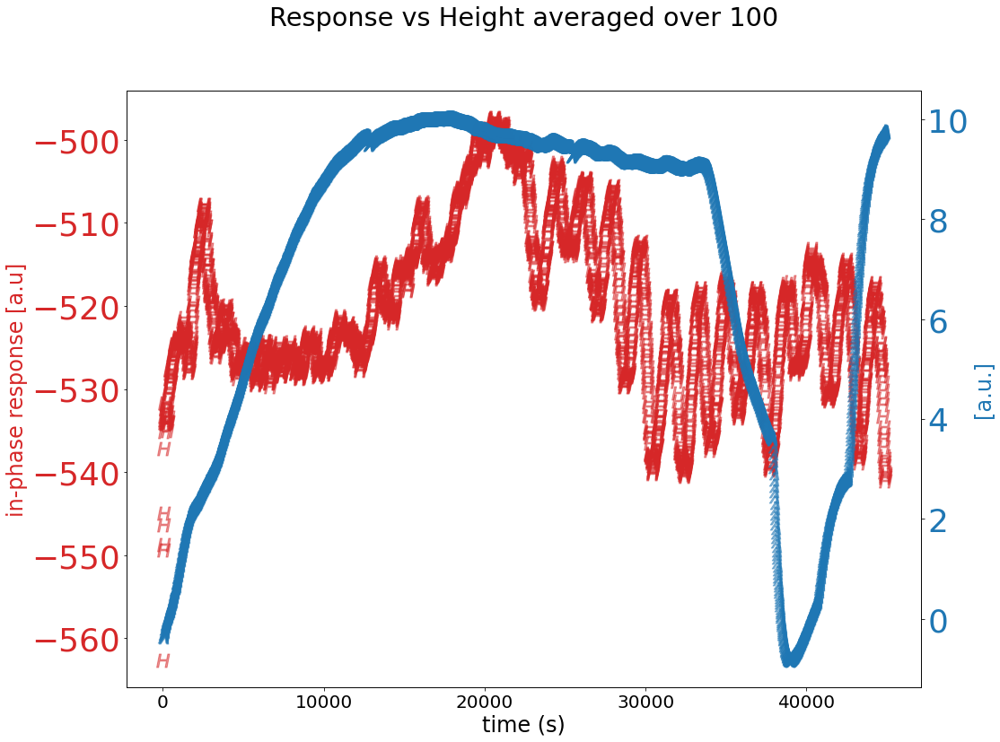

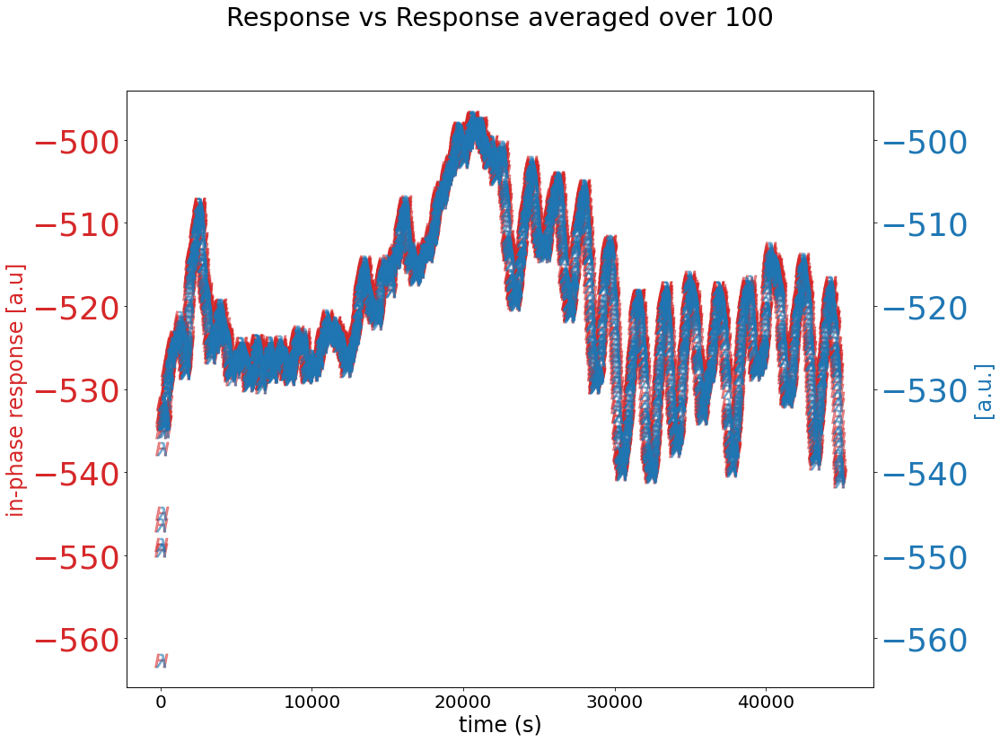

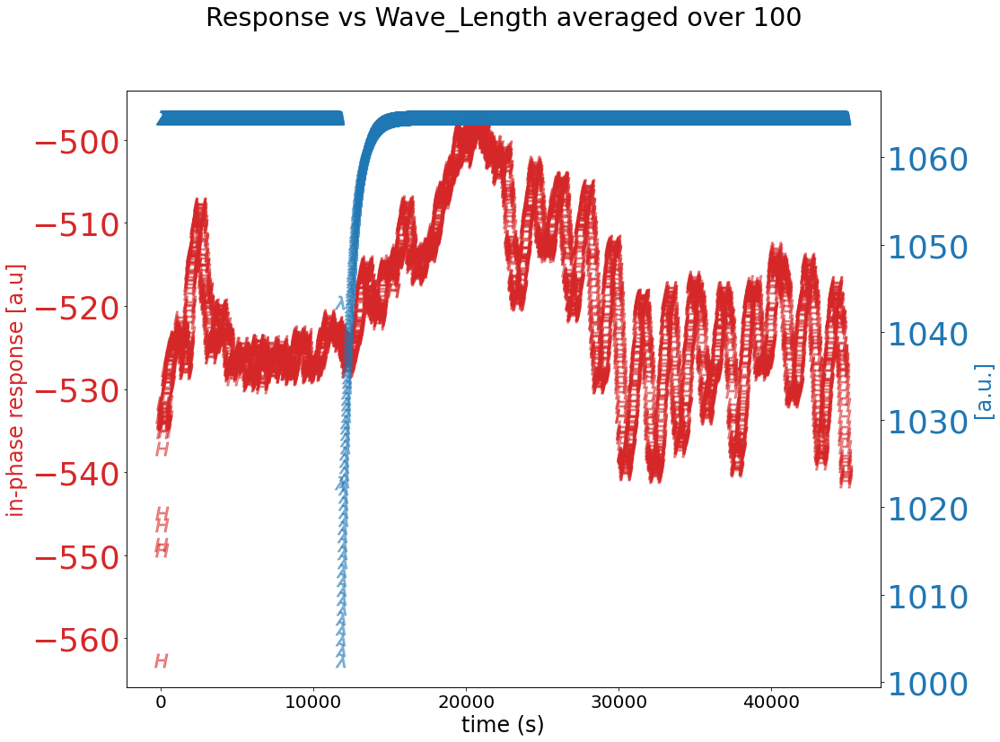

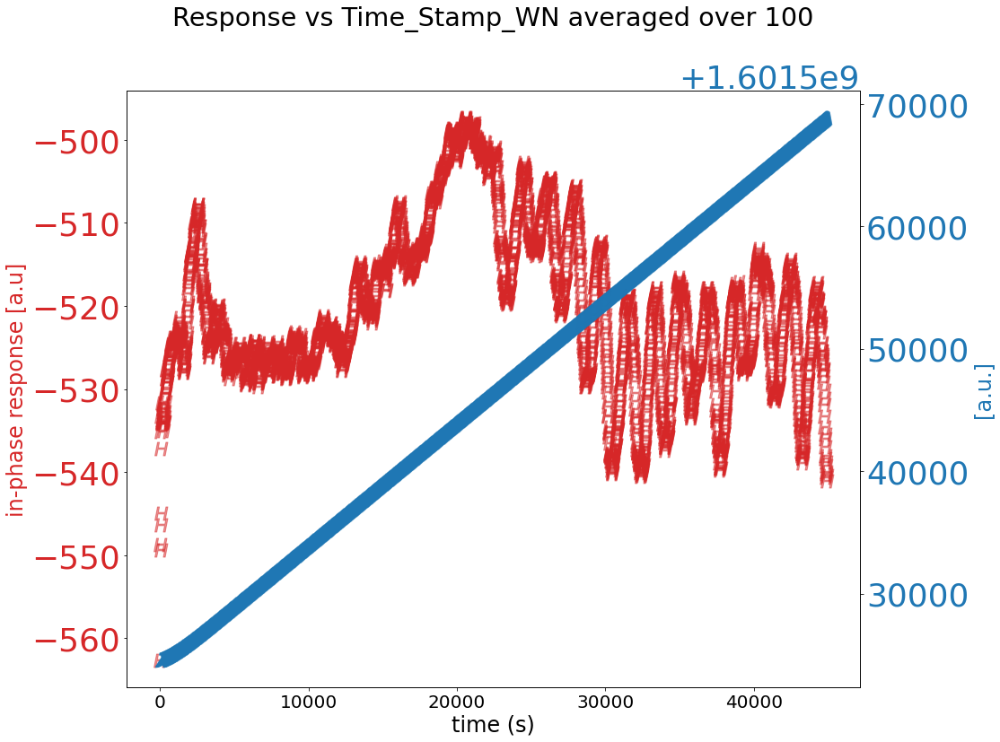

...

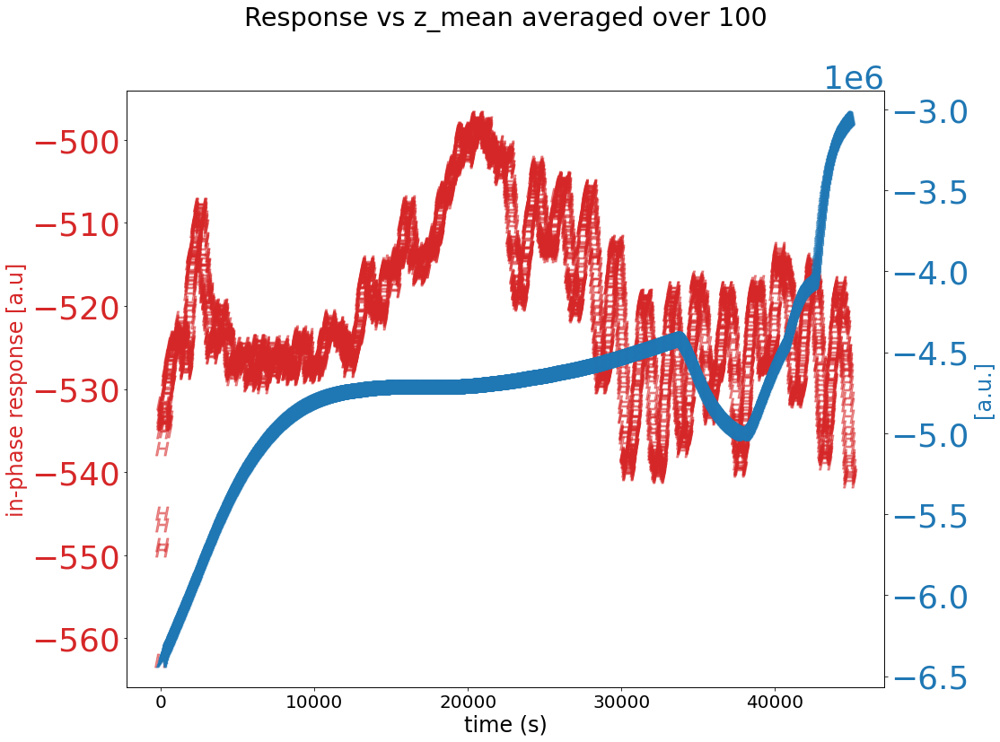

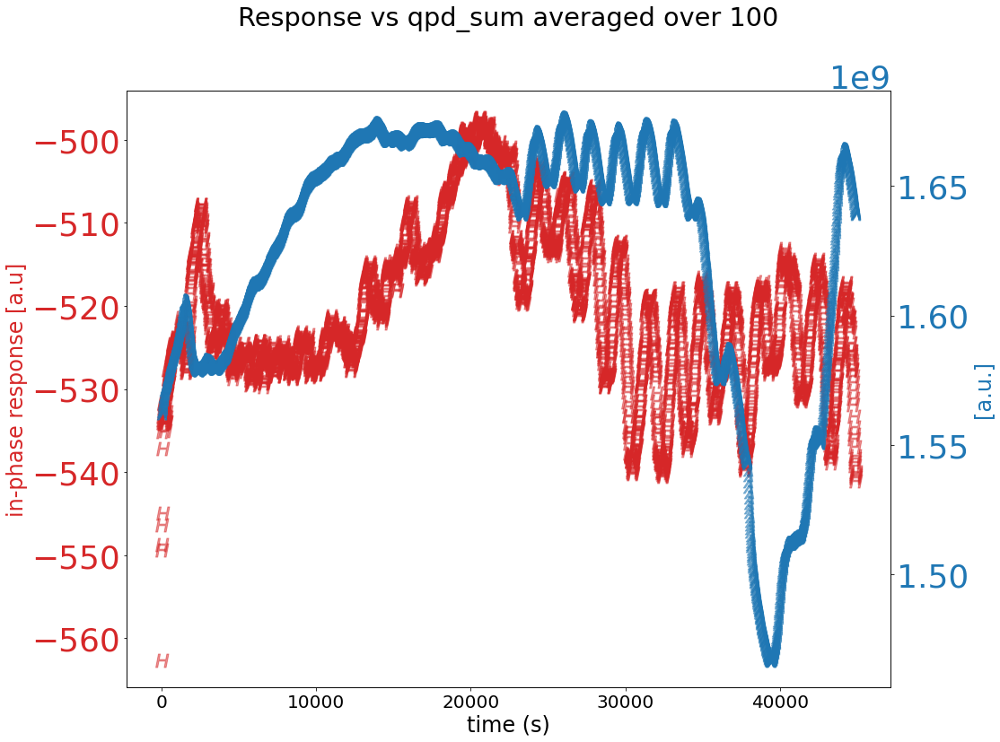

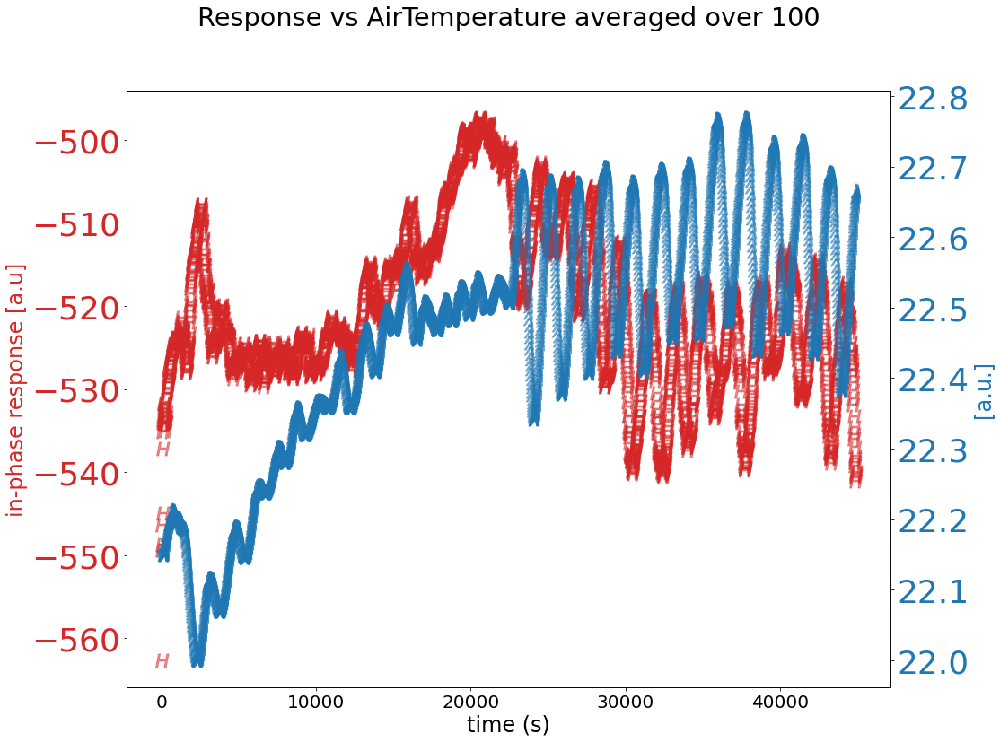

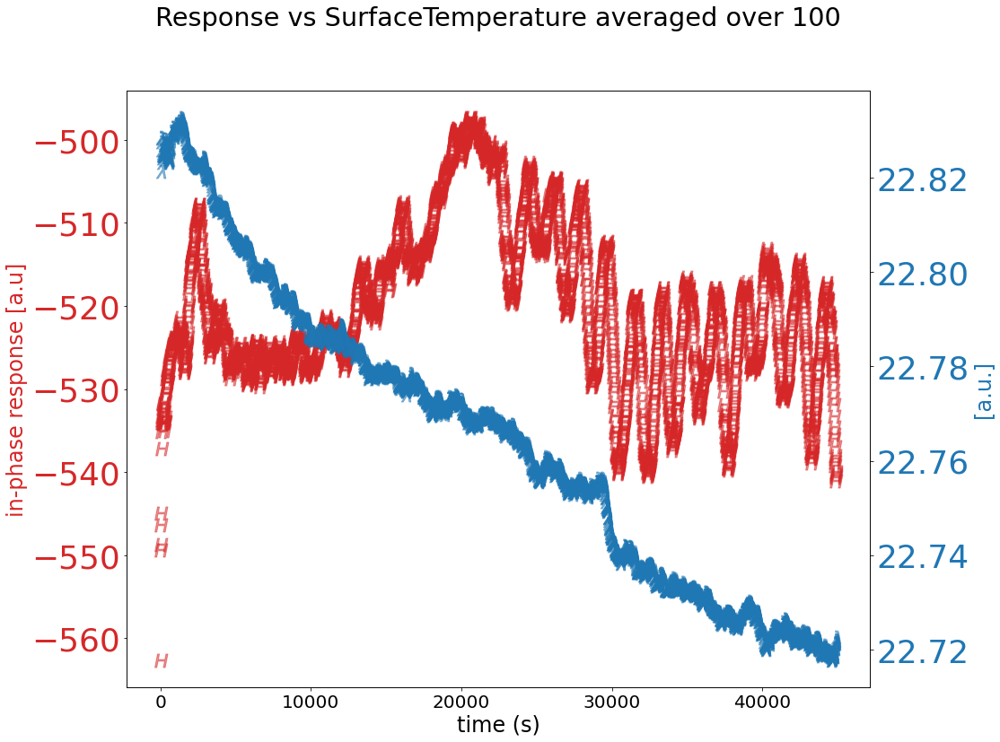

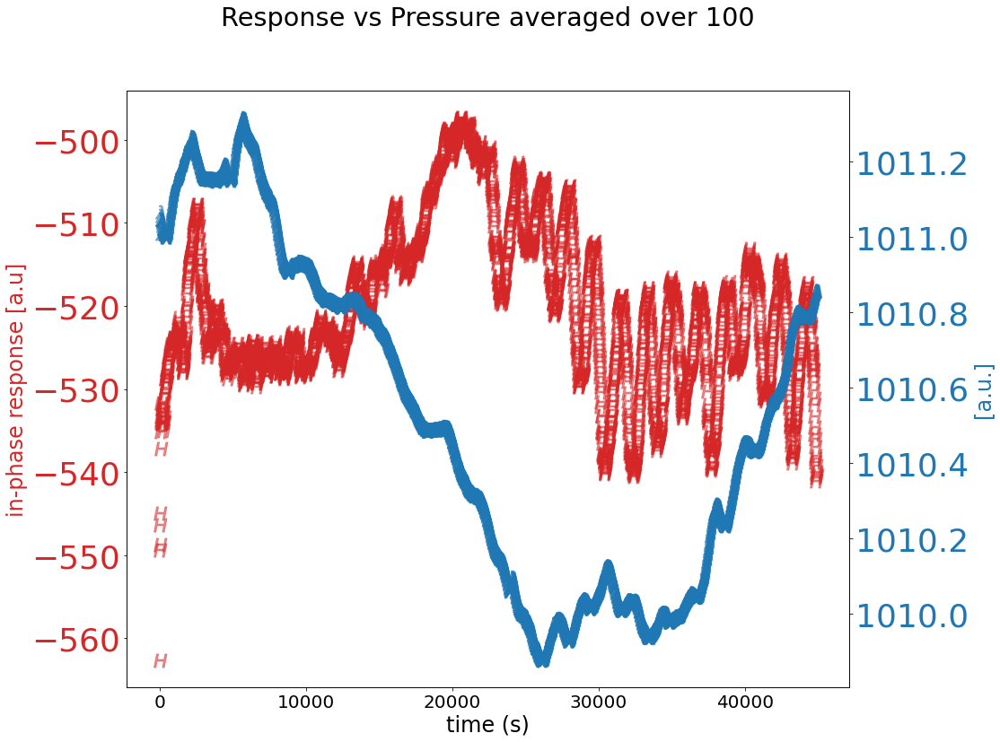

In [84]:
for col in df.columns:
    x = df.Time_Epoch-df.Time_Epoch[0]
    avg = 100
    data1=df.Response.ewm(span=100,adjust=True).mean()
    data2=df["%s" %col].ewm(span=avg,adjust=True).mean()
    fig, ax1 = plt.subplots()
    color = 'tab:red'
    ax1.set_title("Response vs %s averaged over %d" %(col,avg),y=1.1)
    ax1.set_xlabel('time (s)')
    ax1.set_ylabel("in-phase response [a.u]", color=color)
    ax1.plot(x,data1, color=color, alpha=0.5,linestyle="",marker="$H$",markersize=15)
    #ax1.set_xlim(35000,)
    ax1.tick_params(axis='y', labelcolor=color)
    #ax1.set_ylim(1064.526,1064.530)    

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:blue'
    ax2.set_ylabel('[a.u.]', color=color)  # we already handled the x-label with ax1
    ax2.plot(x,data2, color=color, alpha=0.5,linestyle="",marker="$\lambda$",markersize=15)
    ax2.tick_params(axis='y', labelcolor=color)
    #ax2.set_ylim(np.mean(data2)-np.mean(data2)/100,np.mean(data2)+np.mean(data2)+100)    

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

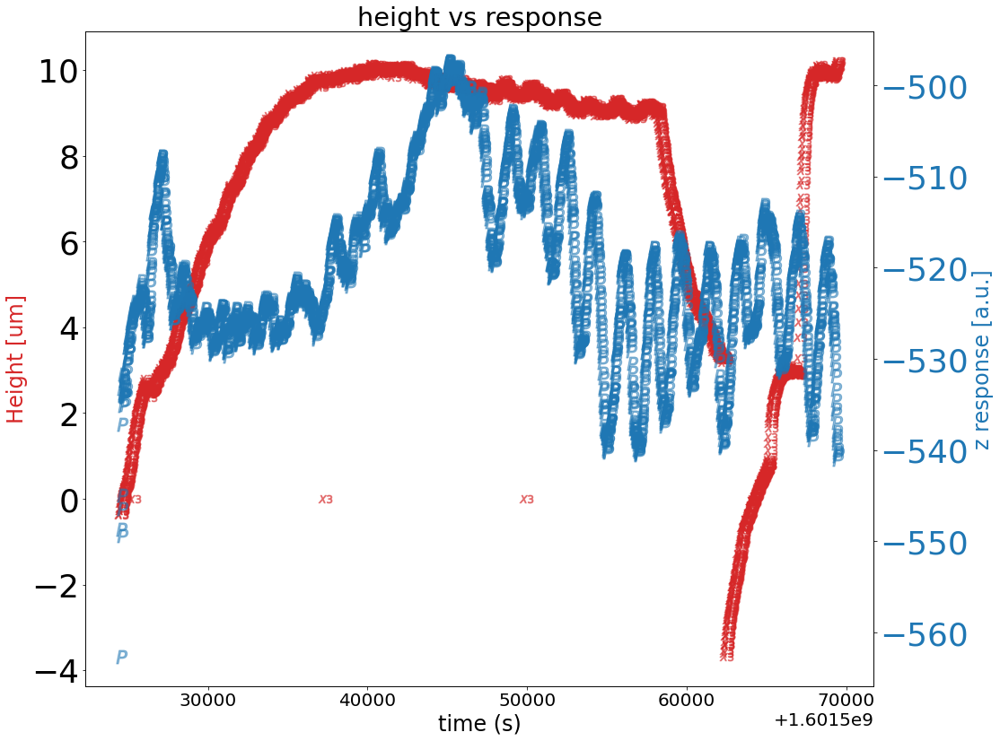

In [11]:
file = 1
x = df.Time_Epoch
data1=df.Height.ewm(span=1,adjust=True).mean()
data2=df.Response.ewm(span=100,adjust=True).mean()
fig, ax1 = plt.subplots()
color = 'tab:red'

ax1.set_title("height vs response")
ax1.set_xlabel('time (s)')
ax1.set_ylabel("Height [um]", color=color)
ax1.plot(x,data1, color=color, alpha=0.5,linestyle="",marker="$X3$",markersize=15)

    
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('z response [a.u.]', color=color)  # we already handled the x-label with ax1
ax2.plot(x,data2, color=color, alpha=0.5,linestyle="",marker="$P$",markersize=15)
ax2.tick_params(axis='y', labelcolor=color)
#ax2.set_ylim(np.mean(data2)+0.847,np.mean(data2)+0.85)    

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

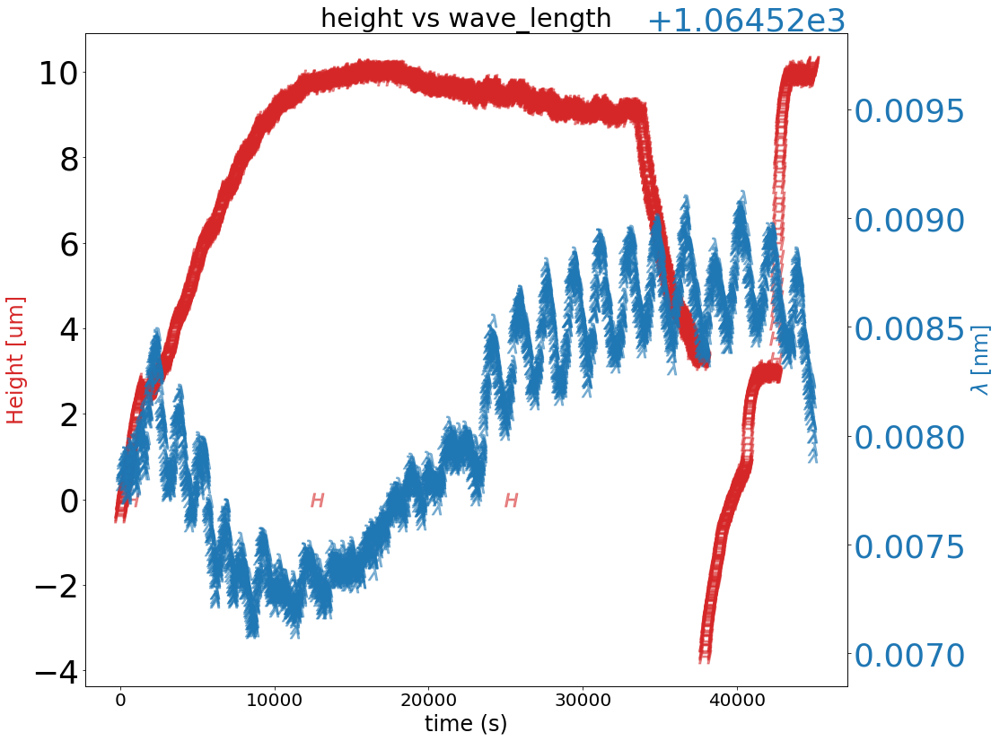

In [12]:
file = 1
x = df.Time_Epoch-df.Time_Epoch[0]
avg = 1
data1=df.Height.ewm(span=avg,adjust=True).mean()
data2=df.Wave_Length.ewm(span=avg,adjust=True).mean()
fig, ax1 = plt.subplots()
color = 'tab:red'
ax1.set_title("height vs wave_length")
ax1.set_xlabel('time (s)')
ax1.set_ylabel("Height [um]", color=color)
ax1.plot(x,data1, color=color, alpha=0.5,linestyle="",marker="$H$",markersize=15)
#ax1.set_xlim(35000,)
    
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('$\lambda$ [nm]', color=color)  # we already handled the x-label with ax1
ax2.plot(x,data2, color=color, alpha=0.5,linestyle="",marker="$\lambda$",markersize=15)
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(np.mean(data2)+0.847,np.mean(data2)+0.85)    

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [ ]:
file = 1
x = df.Time_Epoch-df.Time_Epoch[0]
avg = 1
data1=df.Height.ewm(span=avg,adjust=True).mean()
data2=df.Wave_Length.ewm(span=avg,adjust=True).mean()
fig, ax1 = plt.subplots()
color = 'tab:red'
ax1.set_title("height vs wave_length")
ax1.set_xlabel('time (s)')
ax1.set_ylabel("Height [um]", color=color)
ax1.plot(x,data1, color=color, alpha=0.5,linestyle="",marker="$H$",markersize=15)
#ax1.set_xlim(35000,)
    
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('$\lambda$ [nm]', color=color)  # we already handled the x-label with ax1
ax2.plot(x,data2, color=color, alpha=0.5,linestyle="",marker="$\lambda$",markersize=15)
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(np.mean(data2)+0.847,np.mean(data2)+0.85)    

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [91]:
df.Height.corr(df.Wave_Length)

-0.019878448762031486

In [92]:
df.Response.corr(df.Wave_Length)

0.010031603629854113

In [38]:
df=pd.DataFrame()    
year=2020
month=9
days=[25,26,27,28,29,30]
bead_date=20200924
bead_number=1
# prepare the files to match the time stamp to extract the environmental data
fnw = []
month=9
for day in days:
    df_temp=pd.DataFrame()
    wvm = np.load("/data/new_trap_processed/processed_files/{0}/Bead{1}/EnvData/{2}{3}{4}/wavemeter_data_{2}{3}{4}.pkl".format(bead_date,bead_number,year,str(month).zfill(2),str(day).zfill(2)),allow_pickle=True)
    df_temp = wvm
    df=pd.concat([df,df_temp])
bead_date=20200930
bead_number=1  
month=10
days=[1]
for day in days:
    df_temp=pd.DataFrame()
    wvm = np.load("/data/new_trap_processed/processed_files/{0}/Bead{1}/EnvData/{2}{3}{4}/wavemeter_data_{2}{3}{4}.pkl".format(bead_date,bead_number,year,str(month).zfill(2),str(day).zfill(2)),allow_pickle=True)
    df_temp = wvm
    df=pd.concat([df,df_temp])



In [45]:
df = df.reset_index()
df = df[df.WAVE_LENGTH>1064]
df["MEASUREMENT_TIME"] = df.TIMESTAMP_WM_EPOCH-df.TIMESTAMP_WM_EPOCH[0]

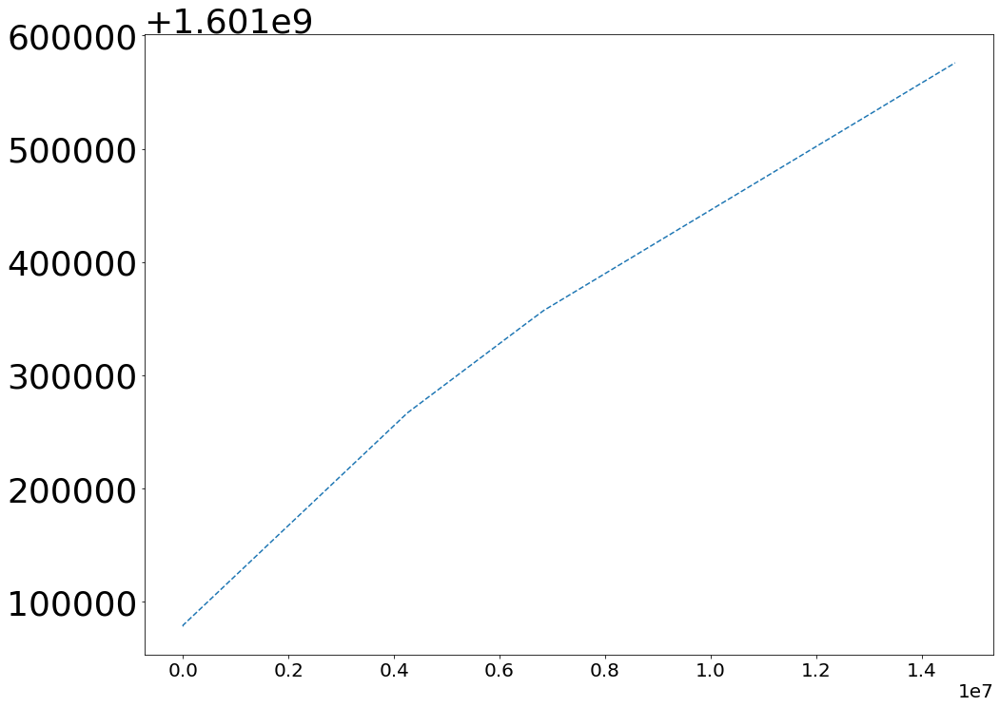

In [46]:
plt.plot(df.TIMESTAMP_WM_EPOCH,linestyle="dashed")

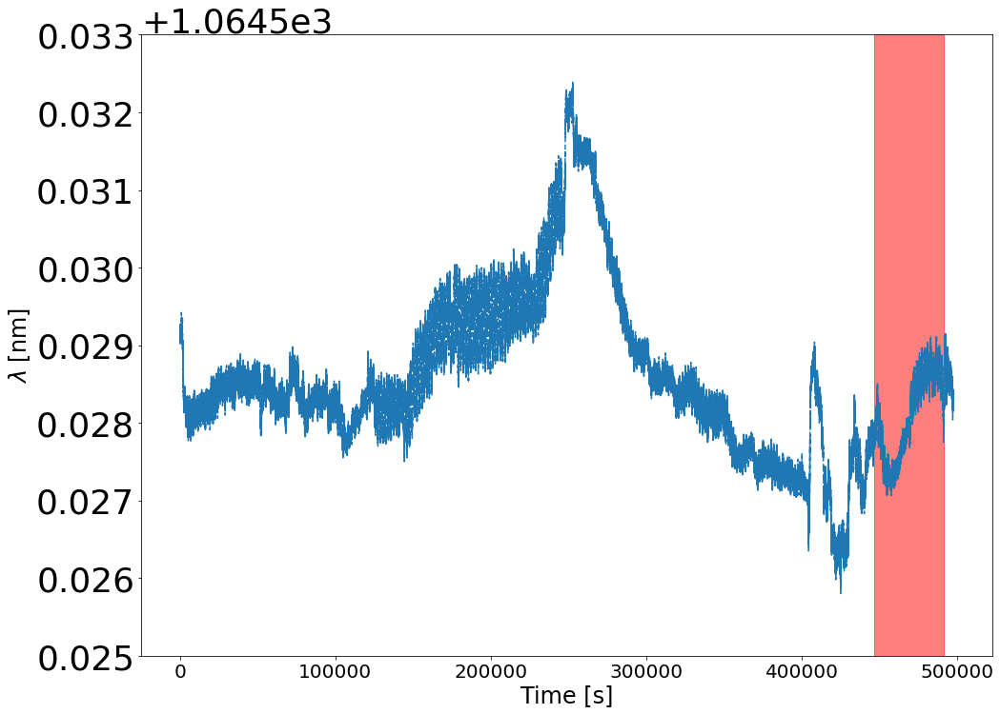

In [66]:
plt.plot(df.MEASUREMENT_TIME,df.WAVE_LENGTH,linestyle='dashed')
plt.xlabel("Time [s]")
plt.ylabel("$\lambda$ [nm]")
plt.axvspan(t[0]-df.TIMESTAMP_WM_EPOCH[0],t[-1]-df.TIMESTAMP_WM_EPOCH[0],alpha=0.5,label="Moseley",color="red")
plt.ylim(1064.525,1064.533)
plt.show()

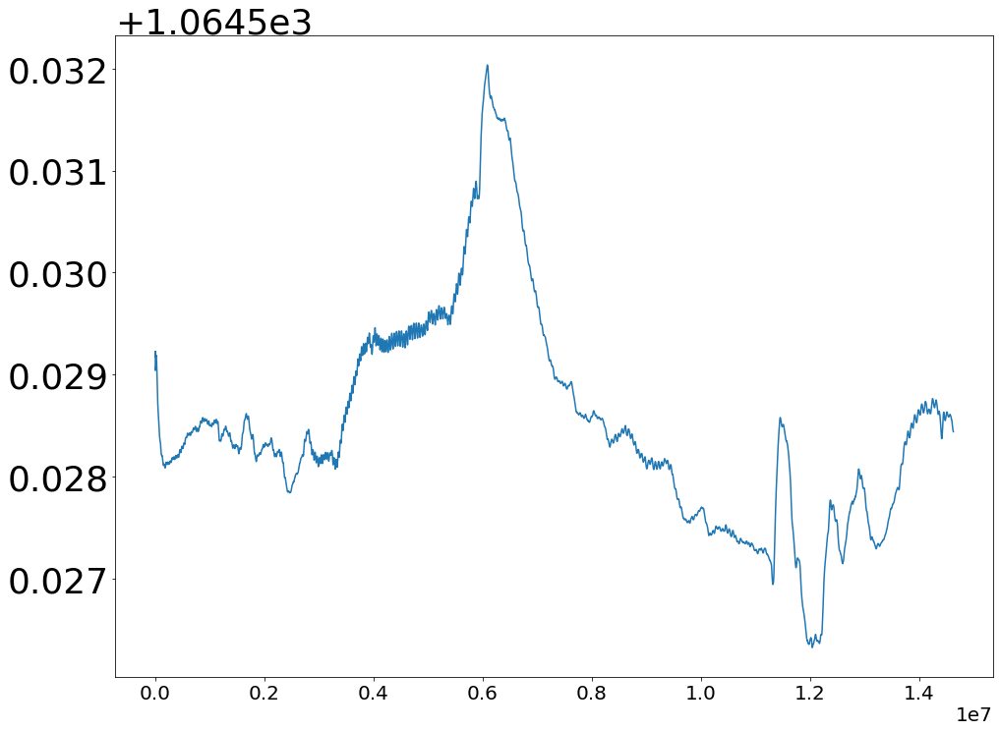

In [58]:
plt.plot(df.WAVE_LENGTH.ewm(span=100000,adjust=True).mean())

In [59]:
t= np.load("time_height_response_check.npy")

In [74]:
dt.datetime.fromtimestamp(df.TIMESTAMP_WM_EPOCH[0])

datetime.datetime(2020, 9, 25, 16, 53, 0, 44011)

In [ ]:
days=[30]
bead_date=20200930
bead_number=1
# prepare the files to match the time stamp to extract the environmental data
fnw = []
month=9
for day in days:
    env_file = "/data/new_trap_processed/processed_files/{0}/Bead{1}/EnvData/{2}{3}{4}/wavemeter_data_{2}{3}{4}.pkl".format(bead_date,bead_number,year,str(month).zfill(2),str(day).zfill(2))
    fnw.append(env_file)
month=10
days=[1]
for day in days:
    env_file = "/data/new_trap_processed/processed_files/{0}/Bead{1}/EnvData/{2}{3}{4}/wavemeter_data_{2}{3}{4}.pkl".format(bead_date,bead_number,year,str(month).zfill(2),str(day).zfill(2))
    fnw.append(env_file)
    
df_temp_list = []
df_temp_list.extend([pd.read_pickle(f) for f in fnw]) # read the files in
df_temp = pd.concat([df_tempi for df_tempi in df_temp_list]).reset_index() # merge the dataframes, you can merge as much as you want since later the time stamps are anyway used. But maybe stay efficient, will ya?
wave_length,laser_freq,time_stamp_wm,values = [[] for i in range(4)]
for elements in tqdm(range(len(df))): # fun fact: faster than all the possible apply methods. Tried a lot but this is best. DO NOT PARLLELIZE with joblib
    values = df_temp.iloc[(df_temp['TIMESTAMP_WM_EPOCH']-df["Time_Epoch"][elements]).abs().argsort()[:1]][['WAVE_LENGTH','LASER_FREQ','TIMESTAMP_WM_EPOCH']].values[0]   # this one subtracts the time_epoch of the data set from the entire column and gets the minimum. Afterwards it adds it if the time difference is less than 10 seconds.
   # print(np.abs(values[2]-df["Time_Epoch"][elements]))
    #print(values[2])
    #print(df["Time_Epoch"][elements])
    if(np.abs(values[2]-df["Time_Epoch"][elements])<10):
        wave_length.append(values[0])
        laser_freq.append(values[1])
        time_stamp_wm.append(values[2])
    else:
        print("Time difference is to big!")
        wave_length.append(0)
        laser_freq.append(0)
        time_stamp_wm.append(values[2])
df["Wave_Length"] = wave_length
df["Time_Stamp_WN"] = time_stamp_wm
